In [23]:
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from shapely import wkt
import glob
import math

In [24]:
# cycle_lane_df = pd.concat([pd.read_csv(f, low_memory=False) for f in glob.glob('./Data/Extract_data/cycle_lane_track_line.csv')], sort=True)
cycle_lane_df = pd.read_csv('./Data/Extract_data/cycle_lane_track_line.csv')

In [25]:
cycle_lane_df['geometry'] = cycle_lane_df['geometry'].apply(wkt.loads)
cycle_lane_gdf = gpd.GeoDataFrame(cycle_lane_df, geometry='geometry')

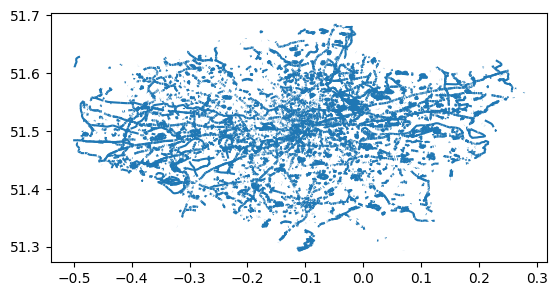

In [26]:
cycle_lane_gdf.plot()
plt.show()

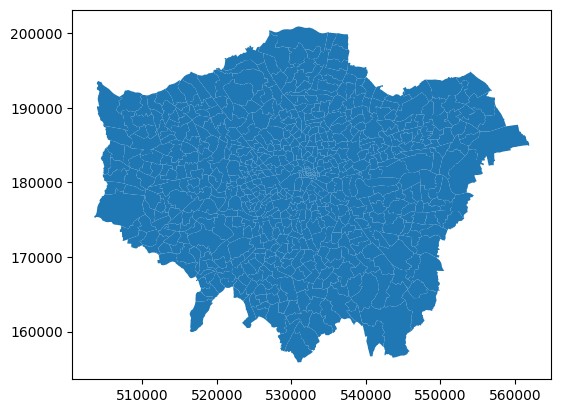

In [27]:
london_gdf = gpd.read_file("./Data/Boundaries/London/ESRI/London_Ward.shp")
london_gdf.plot()
plt.show()

In [28]:
print("gdf1:", london_gdf.crs)
print("gdf2:", cycle_lane_gdf.crs)

gdf1: PROJCS["OSGB 1936 / British National Grid",GEOGCS["OSGB 1936",DATUM["OSGB_1936",SPHEROID["Airy 1830",6377563.396,299.3249646,AUTHORITY["EPSG","7001"]],AUTHORITY["EPSG","6277"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433],AUTHORITY["EPSG","4277"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",49],PARAMETER["central_meridian",-2],PARAMETER["scale_factor",0.999601272],PARAMETER["false_easting",400000],PARAMETER["false_northing",-100000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
gdf2: None


In [29]:
london_gdf.crs = "EPSG:27700"
cycle_lane_gdf.crs = "EPSG:4326"

cycle_lane_gdf = cycle_lane_gdf.to_crs("EPSG:27700")

print("gdf1:", london_gdf.crs)
print("gdf2:", cycle_lane_gdf.crs)

gdf1: EPSG:27700
gdf2: EPSG:27700


## London Cycling Infrastructure

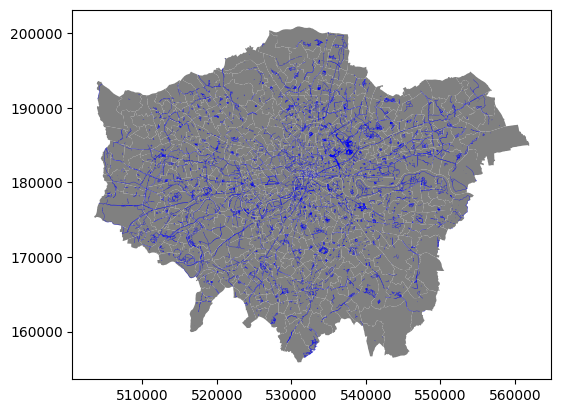

In [30]:
fig, ax = plt.subplots(1, 1)

london_gdf.plot(ax=ax, color='grey')
cycle_lane_gdf.plot(ax=ax, color='blue', lw=0.2)

plt.show()

In [31]:
cycle_lane_gdf

,FEATURE_ID,SVDATE,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,...,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,CLT_ACCESS,CLT_COLOUR,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry
0,RWG154837,2017-10-14,True,False,False,False,FALSE,FALSE,True,FALSE,...,False,False,False,False,NaN,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"MULTILINESTRING ((548080.686 188023.548, 54795..."
1,RWG154839,2017-10-14,True,False,False,False,FALSE,FALSE,True,FALSE,...,False,False,False,False,NaN,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"MULTILINESTRING ((547843.345 187947.619, 54780..."
2,RWG154848,2017-10-14,True,False,False,False,FALSE,FALSE,True,TRUE,...,False,False,False,False,NaN,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"MULTILINESTRING ((548111.705 186872.548, 54807..."
3,RWG154853,2017-10-15,True,False,False,False,FALSE,FALSE,True,FALSE,...,False,False,False,False,NaN,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"MULTILINESTRING ((548526.496 188122.285, 54848..."
4,RWG155003,2017-10-17,True,False,False,False,FALSE,TRUE,False,FALSE,...,False,False,False,False,NaN,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"MULTILINESTRING ((548504.563 186640.298, 54849..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24971,RWG154170,2017-12-06,False,False,False,False,TRUE,FALSE,False,FALSE,...,False,True,False,False,NaN,NONE,Wandsworth,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"MULTILINESTRING ((522976.265 175751.584, 52299..."
24972,RWG107707,2017-11-02,True,False,False,False,TRUE,FALSE,False,TRUE,...,False,False,False,True,Mon-Fri 7-10am 4-7pm,RED,Southwark,https://cycleassetimages.data.tfl.gov.uk/RWG10...,https://cycleassetimages.data.tfl.gov.uk/RWG10...,"MULTILINESTRING ((533868.041 174062.291, 53389..."
24973,RWG221075,2018-02-09,False,False,False,False,TRUE,FALSE,False,FALSE,...,False,True,False,False,NaN,NONE,NaN,https://cycleassetimages.data.tfl.gov.uk/RWG22...,https://cycleassetimages.data.tfl.gov.uk/RWG22...,"MULTILINESTRING ((537464.778 184802.311, 53746..."
24974,RWG276415,2018-03-13,False,False,False,False,TRUE,FALSE,False,FALSE,...,False,False,False,False,NaN,GREEN,NaN,https://cycleassetimages.data.tfl.gov.uk/RWG27...,https://cycleassetimages.data.tfl.gov.uk/RWG27...,"MULTILINESTRING ((535543.268 186617.954, 53557..."


## Cycling Accident Events

In [32]:
accident_2019 = gpd.read_file("./Data/STAT19/accident_2019.shp")
accident_2020 = gpd.read_file("./Data/STAT19/accident_2020.shp")

In [33]:
accident_2019 = accident_2019.rename(columns={'accident_i': 'accident_index'})
accident_2019 = accident_2019.rename(columns={'number_of_': 'number_of_vehicles'})
accident_2019 = accident_2019.rename(columns={'speed_limi': 'speed_limit'})
accident_2019 = accident_2019.rename(columns={'day_of_wee': 'day_of_week'})
accident_2019 = accident_2019.rename(columns={'accident_s': 'accident_severity'})

In [34]:
accident_2020 = accident_2020.rename(columns={'accident_i': 'accident_index'})
accident_2020 = accident_2020.rename(columns={'number_of_': 'number_of_vehicles'})
accident_2020 = accident_2020.rename(columns={'speed_limi': 'speed_limit'})
accident_2020 = accident_2020.rename(columns={'day_of_wee': 'day_of_week'})
accident_2020 = accident_2020.rename(columns={'accident_s': 'accident_severity'})

In [35]:
vehicle_df_2019 = pd.concat([pd.read_csv(f, low_memory=False) for f in glob.glob('./Data/STAT19/dft-road-casualty-statistics-vehicle-2019.csv')], sort=True)
vehicle_df_2020 = pd.concat([pd.read_csv(f, low_memory=False) for f in glob.glob('./Data/STAT19/dft-road-casualty-statistics-vehicle-2020.csv')], sort=True)
# accident_df_2019 = pd.concat([pd.read_csv(f, low_memory=False) for f in glob.glob('./Data/STAT19/dft-road-casualty-statistics-accident-2019.csv')], sort=True)
# accident_df_2020 = pd.concat([pd.read_csv(f, low_memory=False) for f in glob.glob('./Data/STAT19/dft-road-casualty-statistics-accident-2020.csv')], sort=True)

In [36]:
cycle_df_2019 = vehicle_df_2019[vehicle_df_2019['vehicle_type'] == 1]
cycle_df_2020 = vehicle_df_2020[vehicle_df_2020['vehicle_type'] == 1]

In [37]:
merged_cycle_2019 = cycle_df_2019.merge(accident_2019, on='accident_index')
variables = ['accident_index', 'accident_y', 'speed_limit', 'vehicle_type', 'date', 'day_of_week', 'accident_severity', 'road_type',
             'longitude', 'latitude', 'number_of_vehicles', 'time']
merged_cycle_2019 = merged_cycle_2019[variables]
print(merged_cycle_2019)

     accident_index  accident_y  speed_limit  vehicle_type        date  \
0     2019010155191        2019           30             1  01/01/2019   
1     2019010155242        2019           30             1  01/01/2019   
2     2019010155282        2019           20             1  01/01/2019   
3     2019010155301        2019           20             1  01/01/2019   
4     2019010155306        2019           20             1  01/01/2019   
...             ...         ...          ...           ...         ...   
4890  2019480951112        2019           20             1  10/10/2019   
4891  2019480951151        2019           20             1  24/10/2019   
4892  2019480951155        2019           20             1  06/12/2019   
4893  2019480951177        2019           20             1  12/12/2019   
4894  2019480951182        2019           20             1  17/12/2019   

      day_of_week  accident_severity  road_type  longitude   latitude  \
0               3                  3  

In [38]:
merged_cycle_2020 = cycle_df_2020.merge(accident_2020, on='accident_index')
variables = ['accident_index', 'accident_y', 'speed_limit', 'vehicle_type', 'date', 'day_of_week', 'accident_severity', 'road_type',
             'longitude', 'latitude', 'number_of_vehicles', 'time']
merged_cycle_2020 = merged_cycle_2020[variables]

In [39]:
# merged_cycle_2019.to_csv('merged_cycle_2019.csv', index=False)
# merged_cycle_2020.to_csv('merged_cycle_2020.csv', index=False)

from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(merged_cycle_2019['longitude'], merged_cycle_2019['latitude'])]
merged_cycle_2019_gdf = gpd.GeoDataFrame(merged_cycle_2019, geometry=geometry)
merged_cycle_2019_gdf.crs = "EPSG:4326" 

geometry = [Point(xy) for xy in zip(merged_cycle_2020['longitude'], merged_cycle_2020['latitude'])]
merged_cycle_2020_gdf = gpd.GeoDataFrame(merged_cycle_2020, geometry=geometry)
merged_cycle_2020_gdf.crs = "EPSG:4326" 

merged_cycle_2019_gdf = merged_cycle_2019_gdf.to_crs("EPSG:27700")
merged_cycle_2020_gdf = merged_cycle_2020_gdf.to_crs("EPSG:27700")

In [40]:
merged_cycle_2019_gdf

,accident_index,accident_y,speed_limit,vehicle_type,date,day_of_week,accident_severity,road_type,longitude,latitude,number_of_vehicles,time,geometry
0,2019010155191,2019,30,1,01/01/2019,3,3,6,-0.124193,51.526795,2,01:50:00.000,POINT (530223.770 182543.296)
1,2019010155242,2019,30,1,01/01/2019,3,3,3,-0.336704,51.482519,2,09:41:00.000,POINT (515594.485 177263.040)
2,2019010155282,2019,20,1,01/01/2019,3,2,6,-0.018574,51.522863,2,17:37:00.000,POINT (537561.896 182299.164)
3,2019010155301,2019,20,1,01/01/2019,3,3,6,-0.113933,51.324400,2,21:15:00.000,POINT (531514.802 160054.898)
4,2019010155306,2019,20,1,01/01/2019,3,3,6,-0.028530,51.569029,2,17:42:00.000,POINT (536732.873 187414.288)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4890,2019480951112,2019,20,1,10/10/2019,5,3,3,-0.082984,51.516299,1,17:01:00.000,POINT (533112.832 181450.197)
4891,2019480951151,2019,20,1,24/10/2019,5,3,3,-0.081010,51.516968,1,18:10:00.000,POINT (533247.840 181528.181)
4892,2019480951155,2019,20,1,06/12/2019,6,3,6,-0.107082,51.511124,2,18:30:00.000,POINT (531455.764 180831.196)
4893,2019480951177,2019,20,1,12/12/2019,5,3,3,-0.095531,51.512682,2,15:23:00.000,POINT (532252.772 181025.245)


In [41]:
merged_cycle_2019_gdf.to_csv('merged_cycle_accident_2019.csv', index=False)
merged_cycle_2020_gdf.to_csv('merged_cycle_accident_2020.csv', index=False)

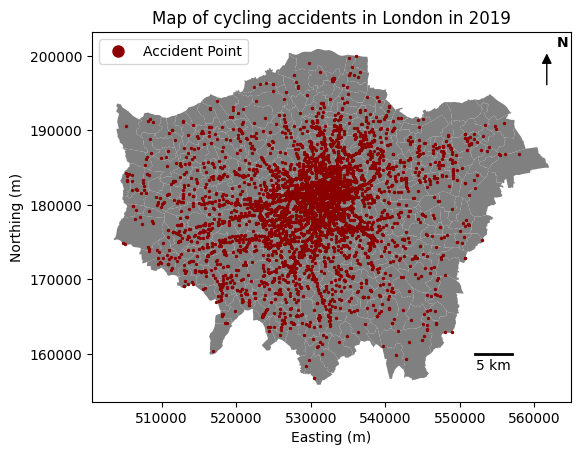

In [201]:
from matplotlib.lines import Line2D
from matplotlib.patches import FancyArrowPatch

fig, ax = plt.subplots()

london_gdf.plot(ax=ax, color='grey')
merged_cycle_2019_gdf.plot(ax=ax, markersize=2, c='darkred')
# ax.scatter(merged_cycle_2019['longitude'], merged_cycle_2019['latitude'], s=1, c='darkred')

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
arrow = FancyArrowPatch(posA=(0.95, 0.85), posB=(0.95, 0.95),
                        arrowstyle='-|>', mutation_scale=15, color='black', transform=ax.transAxes)
ax.add_patch(arrow)
ax.text(0.97, 0.96, 'N', transform=ax.transAxes, weight='bold', color='black')

scale_length = 5000  # 1 km
ax.plot([552000, 552000 + scale_length], [160000, 160000], color='black', linewidth=2, transform=ax.transData)
ax.text(552000 + scale_length/2, 157500, '5 km', horizontalalignment='center', verticalalignment='bottom', color='black', transform=ax.transData)

legend_element = [Line2D([0], [0], marker='o', color='w', label='Accident Point', markersize=10, markerfacecolor='darkred')]
ax.legend(handles=legend_element, loc='upper left')
ax.set_title("Map of cycling accidents in London in 2019")
plt.savefig('Report_Pictures/cycling_accidents_2019.png', dpi=300)

plt.show()


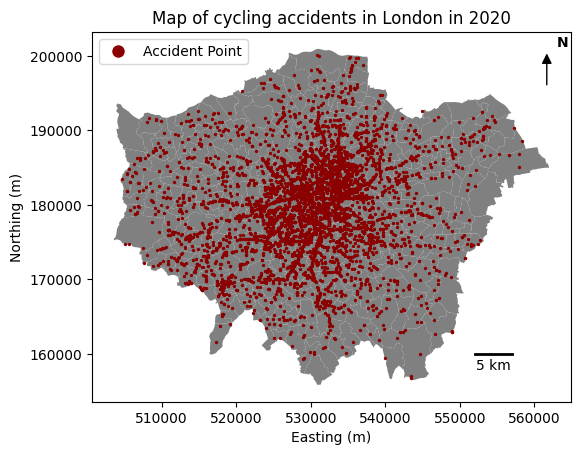

In [202]:
fig, ax = plt.subplots()

london_gdf.plot(ax=ax, color='grey')
merged_cycle_2020_gdf.plot(ax=ax, markersize=2, c='darkred')
# ax.scatter(merged_cycle_2020['longitude'], merged_cycle_2020['latitude'], s=1, c='darkred')
plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')

arrow = FancyArrowPatch(posA=(0.95, 0.85), posB=(0.95, 0.95),
                        arrowstyle='-|>', mutation_scale=15, color='black', transform=ax.transAxes)
ax.add_patch(arrow)
ax.text(0.97, 0.96, 'N', transform=ax.transAxes, weight='bold', color='black')

scale_length = 5000  # 1 km
ax.plot([552000, 552000 + scale_length], [160000, 160000], color='black', linewidth=2, transform=ax.transData)
ax.text(552000 + scale_length/2, 157500, '5 km', horizontalalignment='center', verticalalignment='bottom', color='black', transform=ax.transData)

legend_element = [Line2D([0], [0], marker='o', color='w', label='Accident Point', markersize=10, markerfacecolor='darkred')]
ax.legend(handles=legend_element, loc='upper left')
ax.set_title("Map of cycling accidents in London in 2020")
plt.savefig('Report_Pictures/cycling_accidents_2020.png', dpi=300)

plt.show()

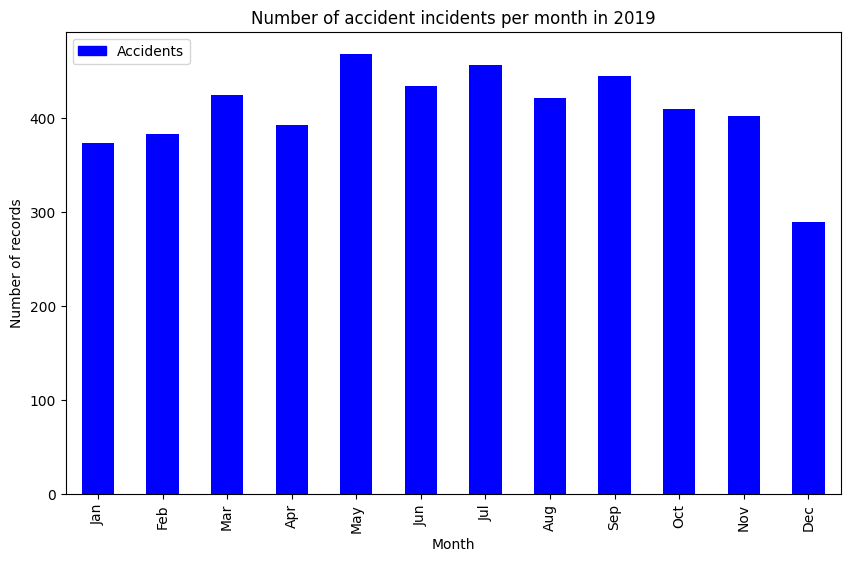

In [136]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches


monthly_counts_2019 = merged_cycle_2019_gdf.groupby(merged_cycle_2019_gdf['date'].dt.month).size()

monthly_counts_2019.plot(kind='bar', figsize=(10, 6), color='blue')
plt.title('Number of accident incidents per month in 2019')
plt.xlabel('Month')
plt.ylabel('Number of records')
plt.xticks(ticks=range(0, 12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Create a patch for the legend
patch = mpatches.Patch(color='blue', label='Accidents')
plt.legend(handles=[patch], loc='upper left')
plt.savefig('Report_Pictures/monthly_counts_2019.png', dpi=300)

plt.show()


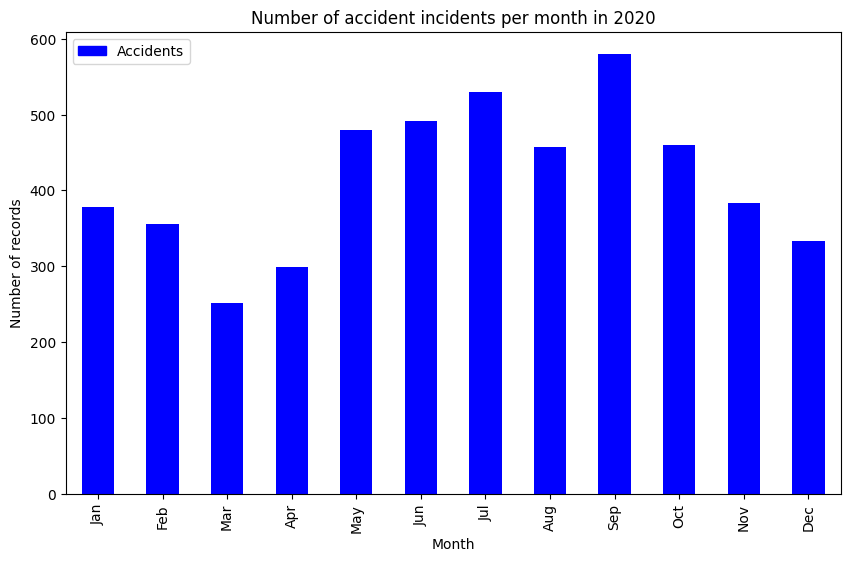

In [137]:
monthly_counts_2020 = merged_cycle_2020_gdf.groupby(merged_cycle_2020_gdf['date'].dt.month).size()

monthly_counts_2020.plot(kind='bar', figsize=(10, 6), color='blue')
plt.title('Number of accident incidents per month in 2020')
plt.xlabel('Month')
plt.ylabel('Number of records')
plt.xticks(ticks=range(0, 12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
patch = mpatches.Patch(color='blue', label='Accidents')
plt.legend(handles=[patch], loc='upper left')
plt.savefig('Report_Pictures/monthly_counts_2020.png', dpi=300)

plt.show()


## London Highways Details

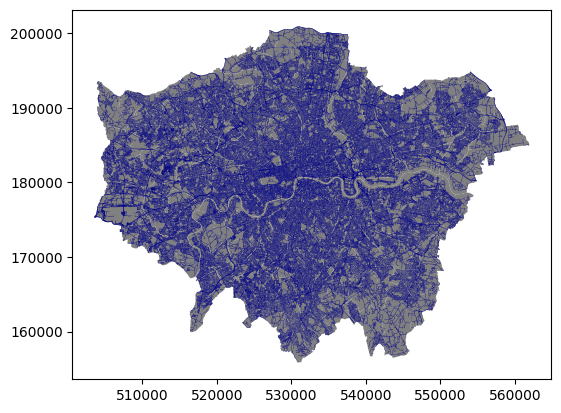

In [46]:
# main_road = gpd.read_file("./Data/UK_roads/Road_Details.shp")

# fig, ax = plt.subplots()
# london_gdf.plot(ax=ax, color='grey')
# main_road.plot(ax=ax, color='darkblue',lw=0.2)
# plt.show()


clipped_road = gpd.read_file("./Data/clipped_highways/clipped_road.shp")

fig, ax = plt.subplots()
london_gdf.plot(ax=ax, color='grey')
clipped_road.plot(ax=ax, color='darkblue',lw=0.2)
plt.show()

In [47]:
clipped_road.columns

Index(['field_1', 'gml_id', 'identifier', 'beginLifes', 'localId', 'namespace',
       'fictitious', 'validFrom', 'reasonForC', 'roadClassi', 'routeHiera',
       'formOfWay', 'trunkRoad', 'primaryRou', 'operationa', 'provenance',
       'length', 'length_uom', 'matchStatu', 'alternateI', 'identifi_1',
       'startGrade', 'endGradeSe', 'inDirectio', 'inDirect_1', 'inOpposite',
       'inOpposi_1', 'roadName', 'averageWid', 'averageW_1', 'minimumWid',
       'minimumW_1', 'confidence', 'alternateN', 'cycleFacil', 'wholeLink',
       'roadStruct', 'roadClas_1', 'geometry'],
      dtype='object')

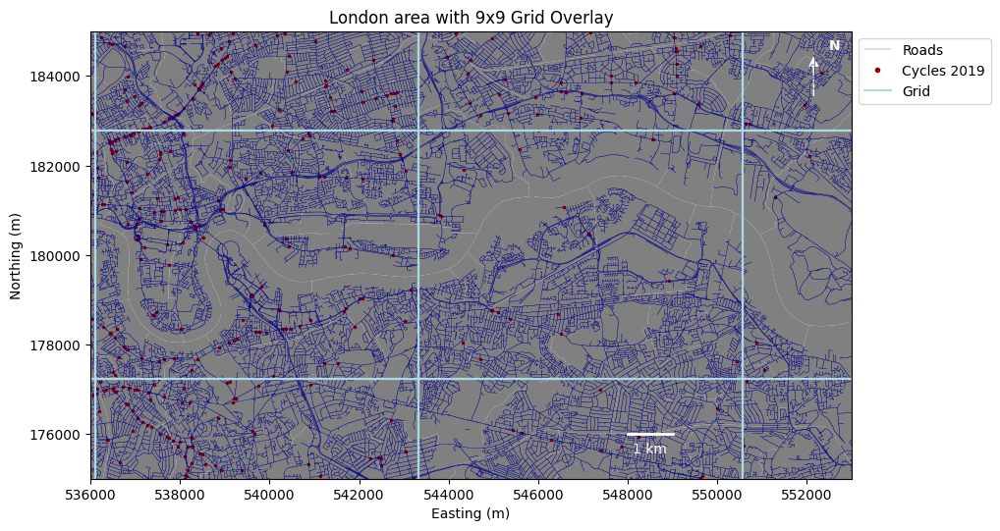

In [51]:
import geopandas as gpd
import matplotlib.pyplot as plt
import shapely.geometry as sg
from matplotlib.lines import Line2D
from matplotlib.patches import FancyArrowPatch

london_gdf = gpd.read_file("./Data/Boundaries/London/ESRI/London_Ward.shp")

x_range = [500000, 565000]
y_range = [155000, 205000]

x_step = (x_range[1] - x_range[0]) / 9
y_step = (y_range[1] - y_range[0]) / 9

grid_data = []

for x in range(9):
    for y in range(9):
        x_left = x_range[0] + x * x_step
        y_bottom = y_range[0] + y * y_step
        x_right = x_left + x_step
        y_top = y_bottom + y_step
        grid_data.append(sg.box(x_left, y_bottom, x_right, y_top))

grid_gdf = gpd.GeoDataFrame(geometry=grid_data)

fig, ax = plt.subplots(figsize=(10, 10))
london_gdf.plot(ax=ax, color='grey')
clipped_road.plot(ax=ax, color='darkblue',lw=0.2)
merged_cycle_2019_gdf.plot(ax=ax, markersize=2, c='darkred')

grid_gdf.boundary.plot(ax=ax, color='lightblue', linewidth=1.5)

# legend_line = Line2D([0], [0], color='lightblue', lw=1.5)
# ax.legend([legend_line], ['Grid'], loc='upper left')

# Plot the GeoDataFrames and save the returned objects for legend
road_line = clipped_road.plot(ax=ax, color='darkblue', lw=0.2)
cycle_points = merged_cycle_2019_gdf.plot(ax=ax, markersize=2, c='darkred')
grid_lines = grid_gdf.boundary.plot(ax=ax, color='lightblue', linewidth=1.5)

# Create custom legend items
legend_elements = [
    Line2D([0], [0], color='darkblue', lw=0.2, label='Roads'),
    Line2D([0], [0], marker='o', color='white', markerfacecolor='darkred', markersize=5, label='Cycles 2019'),
    Line2D([0], [0], color='lightblue', lw=1.5, label='Grid')
]
ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1, 1))

ax.set_title("London area with 9x9 Grid Overlay")

# 添加指北针
arrow = FancyArrowPatch(posA=(0.95, 0.85), posB=(0.95, 0.95),
                        arrowstyle='-|>', mutation_scale=15, color='white', transform=ax.transAxes)
ax.add_patch(arrow)
ax.text(0.97, 0.96, 'N', transform=ax.transAxes, weight='bold', color='white')

# 添加比例尺
scale_length = 1000  # 1 km
ax.plot([548000, 548000 + scale_length], [176000, 176000], color='white', linewidth=2, transform=ax.transData)
ax.text(548000 + scale_length/2, 175500, '1 km', horizontalalignment='center', verticalalignment='bottom', color='white', transform=ax.transData)


plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
ax.set_xlim(536000, 553000)
ax.set_ylim(175000, 185000)
plt.savefig('Report_Pictures/london_area_grid_small.png', dpi=300)

plt.show()

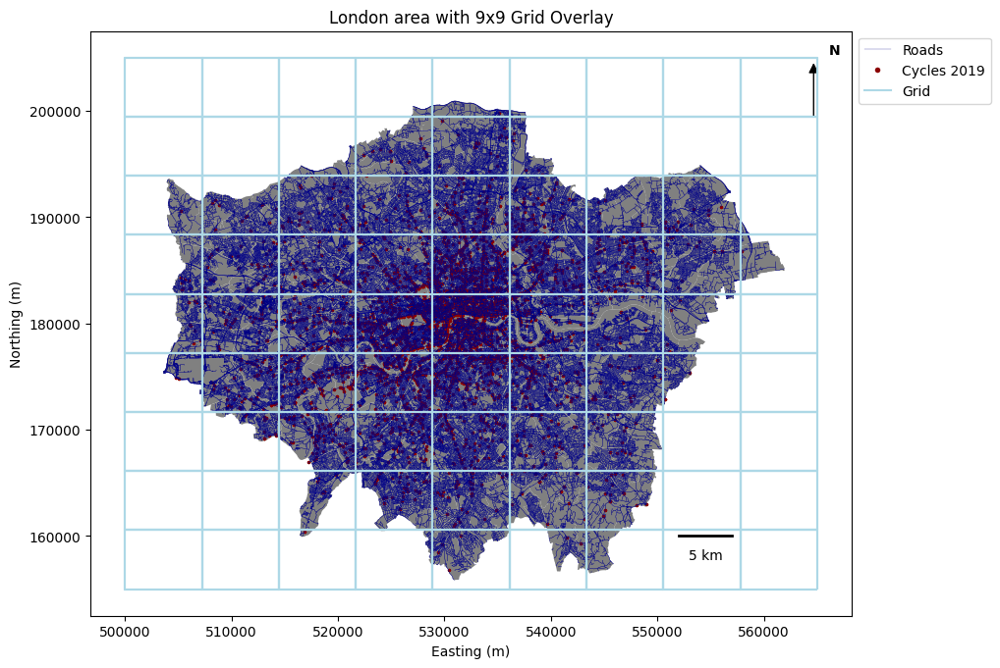

In [58]:
import geopandas as gpd
import matplotlib.pyplot as plt
import shapely.geometry as sg
from matplotlib.lines import Line2D
from matplotlib.patches import FancyArrowPatch

london_gdf = gpd.read_file("./Data/Boundaries/London/ESRI/London_Ward.shp")

x_range = [500000, 565000]
y_range = [155000, 205000]

x_step = (x_range[1] - x_range[0]) / 9
y_step = (y_range[1] - y_range[0]) / 9

grid_data = []

for x in range(9):
    for y in range(9):
        x_left = x_range[0] + x * x_step
        y_bottom = y_range[0] + y * y_step
        x_right = x_left + x_step
        y_top = y_bottom + y_step
        grid_data.append(sg.box(x_left, y_bottom, x_right, y_top))

grid_gdf = gpd.GeoDataFrame(geometry=grid_data)

fig, ax = plt.subplots(figsize=(10, 10))
london_gdf.plot(ax=ax, color='grey')
clipped_road.plot(ax=ax, color='darkblue',lw=0.2)
merged_cycle_2019_gdf.plot(ax=ax, markersize=2, c='darkred')

grid_gdf.boundary.plot(ax=ax, color='lightblue', linewidth=1.5)

# legend_line = Line2D([0], [0], color='lightblue', lw=1.5)
# ax.legend([legend_line], ['Grid'], loc='upper left')

# Plot the GeoDataFrames and save the returned objects for legend
road_line = clipped_road.plot(ax=ax, color='darkblue', lw=0.2)
cycle_points = merged_cycle_2019_gdf.plot(ax=ax, markersize=2, c='darkred')
grid_lines = grid_gdf.boundary.plot(ax=ax, color='lightblue', linewidth=1.5)

# Create custom legend items
legend_elements = [
    Line2D([0], [0], color='darkblue', lw=0.2, label='Roads'),
    Line2D([0], [0], marker='o', color='white', markerfacecolor='darkred', markersize=5, label='Cycles 2019'),
    Line2D([0], [0], color='lightblue', lw=1.5, label='Grid')
]
ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1, 1))

ax.set_title("London area with 9x9 Grid Overlay")

# 添加指北针
arrow = FancyArrowPatch(posA=(0.95, 0.85), posB=(0.95, 0.95),
                        arrowstyle='-|>', mutation_scale=15, color='black', transform=ax.transAxes)
ax.add_patch(arrow)
ax.text(0.97, 0.96, 'N', transform=ax.transAxes, weight='bold', color='black')

# 添加比例尺
scale_length = 5000  # 1 km
ax.plot([552000, 552000 + scale_length], [160000, 160000], color='black', linewidth=2, transform=ax.transData)
ax.text(552000 + scale_length/2, 157500, '5 km', horizontalalignment='center', verticalalignment='bottom', color='black', transform=ax.transData)



plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
# ax.set_xlim(536000, 553000)
# ax.set_ylim(175000, 185000)
plt.savefig('Report_Pictures/london_area_grid_2.png', dpi=300)

plt.show()

## ST DBSCAN

https://github.com/eubr-bigsea/py-st-dbscan

In [56]:
from datetime import timedelta
import pyproj


class STDBSCAN(object):

    def __init__(self, spatial_threshold=50.0, temporal_threshold=1.0,
                 min_neighbors=1):
        """
        Python ST-DBSCAN implementation.
        Because this algorithm needs to calculate multiple distances between
        points, it optimizes by assuming latitude and longitude columns in
        UTM projection. If it is not, convert them by using the
        `coordinates.convert_to_utm` available method.
        UTM projects onto a cylinder, and a cylinder is essentially flat (zero
        Gaussian curvature) so the Euclidean formula would be accurate for
        points on the cylinder (same Zone).
        :param spatial_threshold: Maximum geographical coordinate (spatial)
             distance value (meters);
        :param temporal_threshold: Maximum non-spatial distance value (seconds);
        :param min_neighbors: Minimum number of points within Eps1 and Eps2
             distance;
        """
        self.spatial_threshold = spatial_threshold
        self.temporal_threshold = temporal_threshold
        self.min_neighbors = min_neighbors

    def _retrieve_neighbors(self, index_center, matrix):

        center_point = matrix[index_center, :]

        # filter by time
        min_time = center_point[2] - timedelta(seconds=self.temporal_threshold)
        max_time = center_point[2] + timedelta(seconds=self.temporal_threshold)
        matrix = matrix[(matrix[:, 2] >= min_time) &
                        (matrix[:, 2] <= max_time), :]
        # filter by distance
        tmp = (matrix[:, 0]-center_point[0])*(matrix[:, 0]-center_point[0]) + \
            (matrix[:, 1]-center_point[1])*(matrix[:, 1]-center_point[1])
        neigborhood = matrix[tmp <= (
            self.spatial_threshold*self.spatial_threshold), 4].tolist()
        neigborhood.remove(index_center)

        return neigborhood

    def fit_transform(self, df, col_lat, col_lon, col_time,
                      col_cluster='cluster'):
        """
        :param df: DataFrame input
        :param col_lat: Latitude column name;
        :param col_lon:  Longitude column name;
        :param col_time: Date time column name;
        :param col_cluster: Alias for predicted cluster (default, 'cluster');
        """
        cluster_label = 0
        noise = -1
        unmarked = 777777
        stack = []

        # initial setup
        df = df[[col_lon, col_lat, col_time]]
        df[col_cluster] = unmarked
        df['index'] = range(df.shape[0])
        matrix = df.values
        df.drop(['index'], inplace=True, axis=1)

        # for each point in database
        for index in range(matrix.shape[0]):
            if matrix[index, 3] == unmarked:
                neighborhood = self._retrieve_neighbors(index, matrix)

                if len(neighborhood) < self.min_neighbors:
                    matrix[index, 3] = noise
                else:  # found a core point
                    cluster_label += 1
                    # assign a label to core point
                    matrix[index, 3] = cluster_label

                    # assign core's label to its neighborhood
                    for neig_index in neighborhood:
                        matrix[neig_index, 3] = cluster_label
                        stack.append(neig_index)  # append neighbors to stack

                    # find new neighbors from core point neighborhood
                    while len(stack) > 0:
                        current_point_index = stack.pop()
                        new_neighborhood = \
                            self._retrieve_neighbors(current_point_index,
                                                     matrix)

                        # current_point is a new core
                        if len(new_neighborhood) >= self.min_neighbors:
                            for neig_index in new_neighborhood:
                                neig_cluster = matrix[neig_index, 3]
                                if any([neig_cluster == noise,
                                        neig_cluster == unmarked]):
                                    matrix[neig_index, 3] = cluster_label
                                    stack.append(neig_index)

        df[col_cluster] = matrix[:, 3]
        return df

# 2019 data

In [183]:
merged_cycle_2019_gdf['date'] = pd.to_datetime(merged_cycle_2019_gdf['date'])
print(merged_cycle_2019_gdf['date'])

0      2019-01-01
1      2019-01-01
2      2019-01-01
3      2019-01-01
4      2019-01-01
          ...    
4890   2019-10-10
4891   2019-10-24
4892   2019-06-12
4893   2019-12-12
4894   2019-12-17
Name: date, Length: 4895, dtype: datetime64[ns]


In [184]:
merged_cycle_2019_gdf['x'] = merged_cycle_2019_gdf.geometry.x
merged_cycle_2019_gdf['y'] = merged_cycle_2019_gdf.geometry.y

In [185]:
import warnings
warnings.filterwarnings('ignore')

# Date inputs
stdbscan = STDBSCAN(400, 2592000, 6)

result_2019 = stdbscan.fit_transform(merged_cycle_2019_gdf, 'x', 'y', 'date')

In [186]:
value_counts = result_2019['cluster'].value_counts()
print(value_counts)

-1     4409
 5       40
 4       24
 14      24
 42      17
 15      16
 16      15
 30      13
 17      13
 6       12
 3       11
 45      10
 11      10
 35      10
 43      10
 20      10
 8        9
 26       9
 28       9
 21       9
 40       8
 39       8
 9        8
 25       8
 29       8
 18       8
 46       8
 13       8
 2        7
 48       7
 1        7
 49       7
 31       7
 37       7
 7        7
 10       7
 44       7
 32       7
 24       7
 23       7
 12       7
 41       7
 38       7
 19       7
 27       7
 33       7
 47       7
 36       7
 34       6
 22       5
Name: cluster, dtype: int64


In [187]:
geometry = [Point(xy) for xy in zip(result_2019['x'], result_2019['y'])]
result_2019_gdf = gpd.GeoDataFrame(result_2019, geometry=geometry)

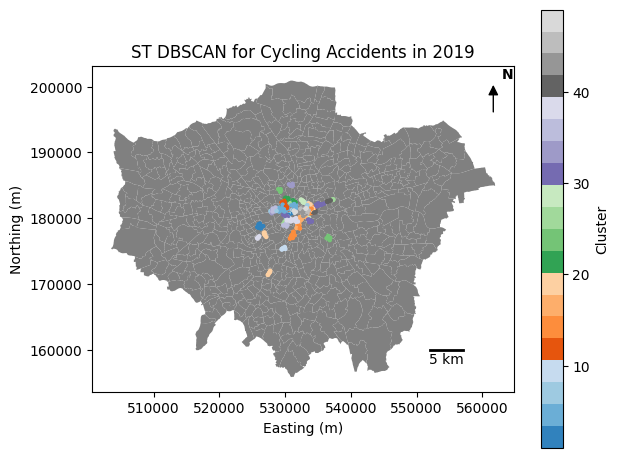

In [329]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1)
london_gdf.plot(ax=ax, color='grey')

cluster_data_2019 = result_2019_gdf[result_2019_gdf['cluster'] != -1]

scatter = ax.scatter(cluster_data_2019['x'], cluster_data_2019['y'], c=cluster_data_2019['cluster'], cmap='tab20c', s=5)

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
plt.title('ST DBSCAN for Cycling Accidents in 2019')

plt.colorbar(scatter, label='Cluster')

arrow = FancyArrowPatch(posA=(0.95, 0.85), posB=(0.95, 0.95),
                        arrowstyle='-|>', mutation_scale=15, color='black', transform=ax.transAxes)
ax.add_patch(arrow)
ax.text(0.97, 0.96, 'N', transform=ax.transAxes, weight='bold', color='black')

scale_length = 5000  # 1 km
ax.plot([552000, 552000 + scale_length], [160000, 160000], color='black', linewidth=2, transform=ax.transData)
ax.text(552000 + scale_length/2, 157500, '5 km', horizontalalignment='center', verticalalignment='bottom', color='black', transform=ax.transData)
ax.set_aspect('equal')
fig.tight_layout()
plt.savefig('Report_Pictures/stdbscan_2019.png', dpi=300, bbox_inches='tight')

plt.show()

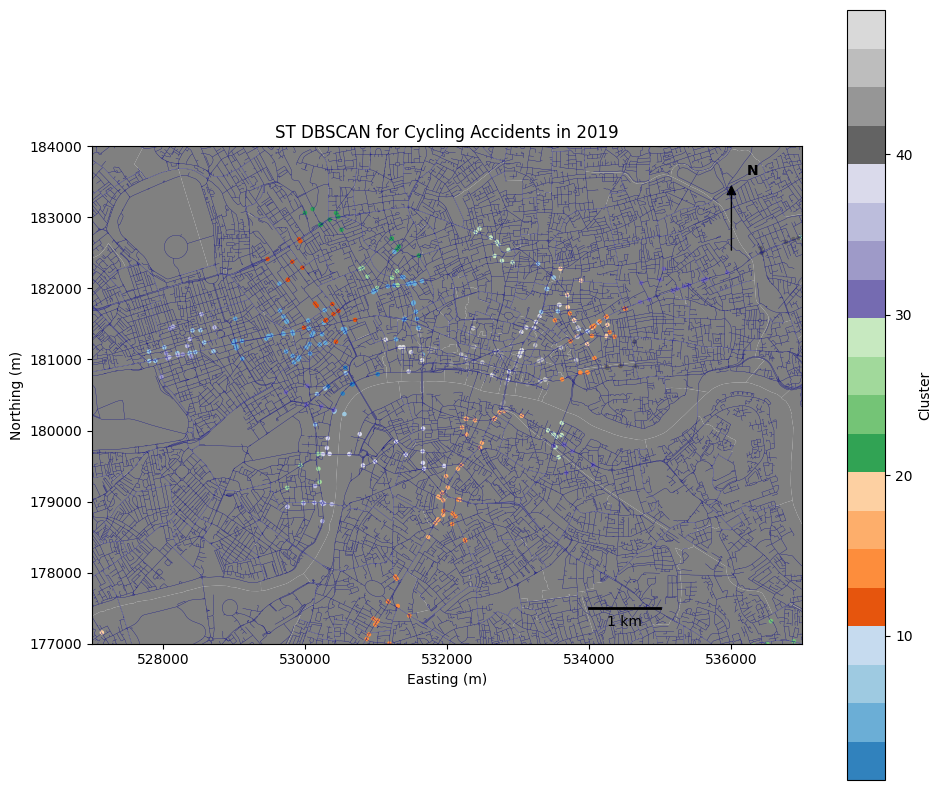

In [328]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

london_gdf.plot(ax=ax, color='grey')
clipped_road.plot(ax=ax, color='darkblue',lw=0.2)

cluster_data_2019 = result_2019_gdf[result_2019_gdf['cluster'] != -1]

scatter = ax.scatter(cluster_data_2019['x'], cluster_data_2019['y'], c=cluster_data_2019['cluster'], cmap='tab20c', s=5)

xmin, xmax = 527000, 537000
ymin, ymax = 177000, 184000

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
plt.title('ST DBSCAN for Cycling Accidents in 2019')

plt.colorbar(scatter, label='Cluster')

arrow_pos_x = 536000  
arrow_pos_y = 182500
arrow_length = 1000 

arrow = FancyArrowPatch((arrow_pos_x, arrow_pos_y), (arrow_pos_x, arrow_pos_y + arrow_length),
                        arrowstyle='-|>', mutation_scale=15, color='black', transform=ax.transData)
ax.add_patch(arrow)
ax.text(arrow_pos_x + 300, arrow_pos_y + arrow_length + 100, 'N', horizontalalignment='center', weight='bold', color='black', transform=ax.transData)

scale_length = 1000  # 1 km
scale_pos_x = 534000  
scale_pos_y = 177500

ax.plot([scale_pos_x, scale_pos_x + scale_length], [scale_pos_y, scale_pos_y], color='black', linewidth=2, transform=ax.transData)
ax.text(scale_pos_x + scale_length/2, scale_pos_y - 300, '1 km', horizontalalignment='center', verticalalignment='bottom', color='black', transform=ax.transData)
ax.set_aspect('equal')
fig.tight_layout()
plt.savefig('Report_Pictures/stdbscan_2019_small.png', dpi=300, bbox_inches='tight')

plt.show()

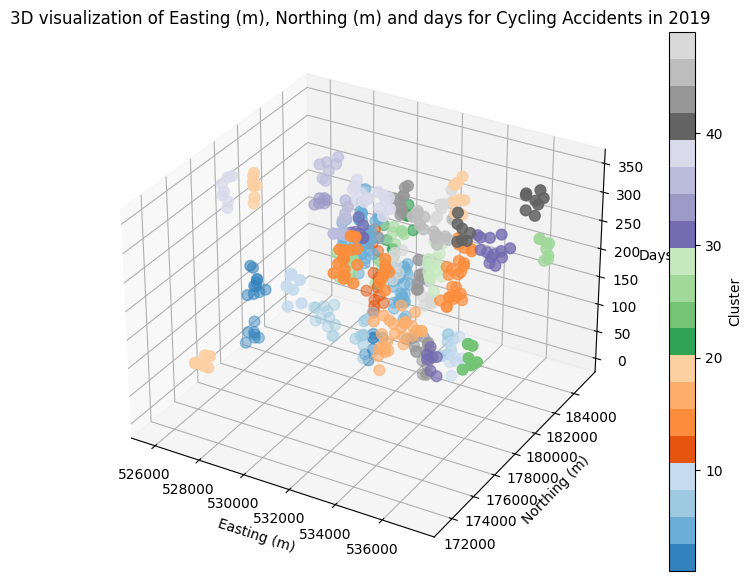

In [203]:

cluster_data_2019['date_num'] = (cluster_data_2019['date'] - cluster_data_2019['date'].min()).dt.days

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(cluster_data_2019['x'], cluster_data_2019['y'], cluster_data_2019['date_num'], c=cluster_data_2019['cluster'], cmap='tab20c', s=60)
ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')
ax.set_zlabel('Days')
ax.set_title('3D visualization of Easting (m), Northing (m) and days for Cycling Accidents in 2019')

# Colorbar
legend = fig.colorbar(scatter, ax=ax)
legend.set_label('Cluster')
plt.savefig('Report_Pictures/stdbscan_2019_3d.png', dpi=300)


plt.show()

In [191]:
first_half_2019 = cluster_data_2019[cluster_data_2019['date'] < '2019-06-01']
second_half_2019 = cluster_data_2019[cluster_data_2019['date'] >= '2019-06-01']

print(len(first_half_2019))
print(len(second_half_2019))

177
309


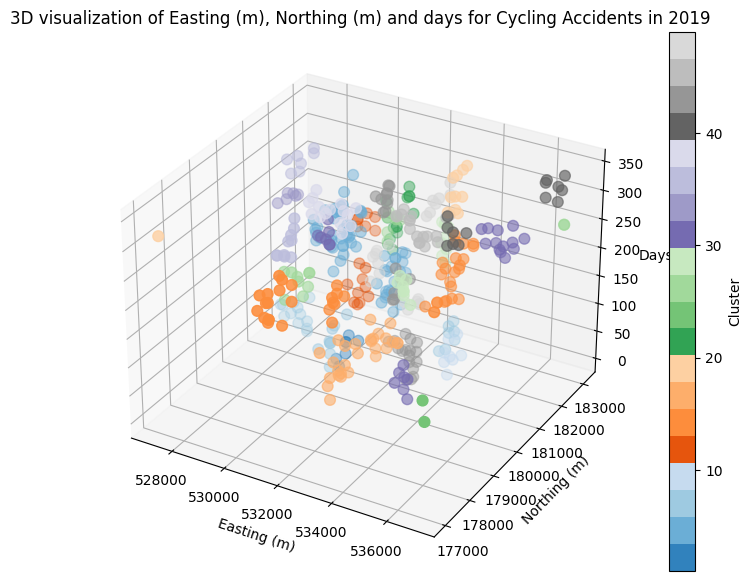

In [204]:
xmin, xmax = 527000, 537000
ymin, ymax = 177000, 184000

# Filtering data based on x and y range
filtered_data_2019 = cluster_data_2019[(cluster_data_2019['x'] >= xmin) & 
                             (cluster_data_2019['x'] <= xmax) & 
                             (cluster_data_2019['y'] >= ymin) & 
                             (cluster_data_2019['y'] <= ymax)]

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(filtered_data_2019['x'], filtered_data_2019['y'], filtered_data_2019['date_num'], c=filtered_data_2019['cluster'], cmap='tab20c', s=60)
ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')
ax.set_zlabel('Days')
ax.set_title('3D visualization of Easting (m), Northing (m) and days for Cycling Accidents in 2019')


# Colorbar
legend = fig.colorbar(scatter, ax=ax)
legend.set_label('Cluster')
plt.savefig('Report_Pictures/stdbscan_2019_3d_small.png', dpi=300)

plt.show()

# 2020 data

In [113]:
merged_cycle_2020_gdf['date'] = pd.to_datetime(merged_cycle_2020_gdf['date'])
print(merged_cycle_2020_gdf['date'])

0      2020-01-01
1      2020-02-01
2      2020-02-01
3      2020-02-01
4      2020-02-01
          ...    
4994   2020-12-11
4995   2020-11-26
4996   2020-08-12
4997   2020-08-12
4998   2020-06-14
Name: date, Length: 4999, dtype: datetime64[ns]


In [114]:
merged_cycle_2020_gdf['time'] = pd.to_datetime(merged_cycle_2020_gdf['time'])
print(merged_cycle_2020_gdf['time'])

0      2023-08-17 19:43:00
1      2023-08-17 08:55:00
2      2023-08-17 08:46:00
3      2023-08-17 15:37:00
4      2023-08-17 15:46:00
               ...        
4994   2023-08-17 06:20:00
4995   2023-08-17 16:30:00
4996   2023-08-17 21:30:00
4997   2023-08-17 21:30:00
4998   2023-08-17 15:02:00
Name: time, Length: 4999, dtype: datetime64[ns]


In [115]:
merged_cycle_2020_gdf['x'] = merged_cycle_2020_gdf.geometry.x
merged_cycle_2020_gdf['y'] = merged_cycle_2020_gdf.geometry.y

In [116]:
import warnings
warnings.filterwarnings('ignore')

# Date inputs
# stdbscan = STDBSCAN(200, 2592000, 6)
stdbscan = STDBSCAN(400, 2592000, 6)
# stdbscan = STDBSCAN(300, 1209600, 3)
# stdbscan = STDBSCAN(300, 1209600, 4)
# stdbscan = STDBSCAN(300, 2419200, 5)
# stdbscan = STDBSCAN(400, 2419200, 6)
result_2020 = stdbscan.fit_transform(merged_cycle_2020_gdf, 'x', 'y', 'date')

In [331]:
result_2020
filtered_result_2020 = result_2020[result_2020['cluster'] != '-1']

filtered_result_2020.to_csv('filtered_result_2020.csv', index=False)

In [117]:
value_counts = result_2020['cluster'].value_counts()
print(value_counts)

-1     4688
 7       42
 8       29
 6       14
 15      14
 1       11
 16      10
 9       10
 22      10
 10      10
 14      10
 21      10
 11       9
 3        8
 20       8
 19       8
 13       8
 2        8
 24       8
 18       7
 5        7
 30       7
 28       7
 25       7
 29       7
 4        7
 12       7
 17       7
 26       7
 27       7
 23       7
Name: cluster, dtype: int64


In [118]:
geometry = [Point(xy) for xy in zip(result_2020['x'], result_2020['y'])]
result_2020_gdf = gpd.GeoDataFrame(result_2020, geometry=geometry)

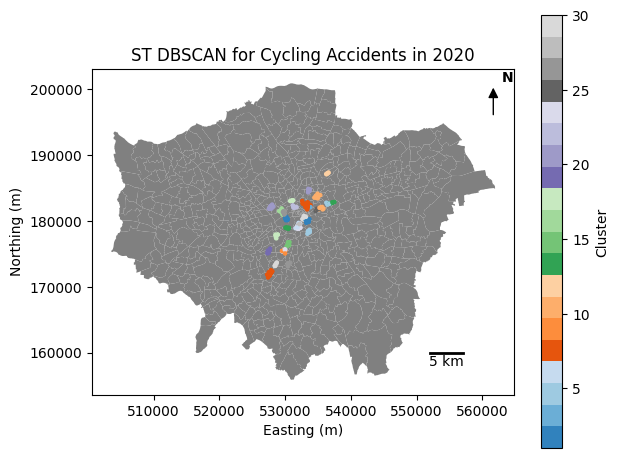

In [326]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1)
london_gdf.plot(ax=ax, color='grey')

cluster_data_2020 = result_2020_gdf[result_2020_gdf['cluster'] != -1]
# cluster_data = cluster_data[cluster_data['cluster'] == 11]
# print(cluster_data)

# cluster_data.plot(ax=ax, cmap='tab20c', markersize=5, c=clusters)
scatter = ax.scatter(cluster_data_2020['x'], cluster_data_2020['y'], c=cluster_data_2020['cluster'], cmap='tab20c', s=5)

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
plt.title('ST DBSCAN for Cycling Accidents in 2020')

plt.colorbar(scatter, label='Cluster')

arrow = FancyArrowPatch(posA=(0.95, 0.85), posB=(0.95, 0.95),
                        arrowstyle='-|>', mutation_scale=15, color='black', transform=ax.transAxes)
ax.add_patch(arrow)
ax.text(0.97, 0.96, 'N', transform=ax.transAxes, weight='bold', color='black')

scale_length = 5000  # 1 km
ax.plot([552000, 552000 + scale_length], [160000, 160000], color='black', linewidth=2, transform=ax.transData)
ax.text(552000 + scale_length/2, 157500, '5 km', horizontalalignment='center', verticalalignment='bottom', color='black', transform=ax.transData)
ax.set_aspect('equal')
fig.tight_layout()
plt.savefig('Report_Pictures/stdbscan_2020.png', dpi=300, bbox_inches='tight')

plt.show()

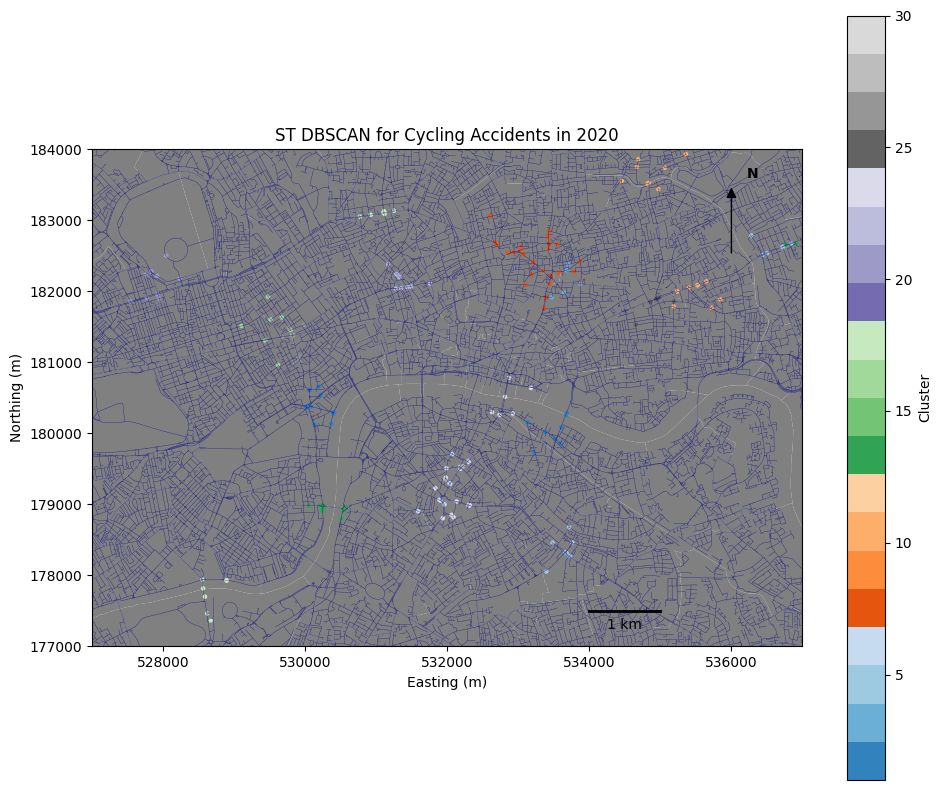

In [325]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

london_gdf.plot(ax=ax, color='grey')
clipped_road.plot(ax=ax, color='darkblue',lw=0.2)

cluster_data_2020 = result_2020_gdf[result_2020_gdf['cluster'] != -1]

scatter = ax.scatter(cluster_data_2020['x'], cluster_data_2020['y'], c=cluster_data_2020['cluster'], cmap='tab20c', s=5)

xmin, xmax = 527000, 537000
ymin, ymax = 177000, 184000

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
plt.title('ST DBSCAN for Cycling Accidents in 2020')

plt.colorbar(scatter, label='Cluster')

arrow_pos_x = 536000  
arrow_pos_y = 182500
arrow_length = 1000 

arrow = FancyArrowPatch((arrow_pos_x, arrow_pos_y), (arrow_pos_x, arrow_pos_y + arrow_length),
                        arrowstyle='-|>', mutation_scale=15, color='black', transform=ax.transData)
ax.add_patch(arrow)
ax.text(arrow_pos_x + 300, arrow_pos_y + arrow_length + 100, 'N', horizontalalignment='center', weight='bold', color='black', transform=ax.transData)

scale_length = 1000  # 1 km
scale_pos_x = 534000  
scale_pos_y = 177500

ax.plot([scale_pos_x, scale_pos_x + scale_length], [scale_pos_y, scale_pos_y], color='black', linewidth=2, transform=ax.transData)
ax.text(scale_pos_x + scale_length/2, scale_pos_y - 300, '1 km', horizontalalignment='center', verticalalignment='bottom', color='black', transform=ax.transData)
ax.set_aspect('equal')
fig.tight_layout()

plt.savefig('Report_Pictures/stdbscan_2020_small.png', dpi=300, bbox_inches='tight')

plt.show()

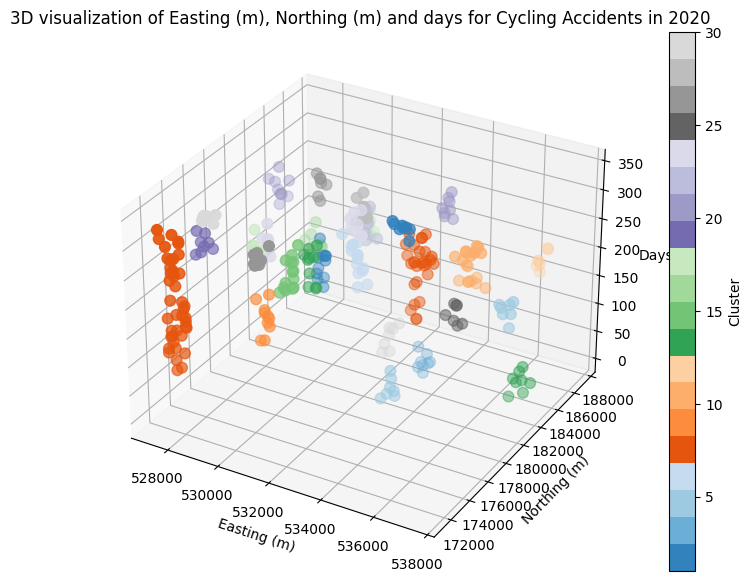

In [205]:
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

cluster_data_2020['date_num'] = (cluster_data_2020['date'] - cluster_data_2020['date'].min()).dt.days

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(cluster_data_2020['x'], cluster_data_2020['y'], cluster_data_2020['date_num'], c=cluster_data_2020['cluster'], cmap='tab20c', s=60)
ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')
ax.set_zlabel('Days')
ax.set_title('3D visualization of Easting (m), Northing (m) and days for Cycling Accidents in 2020')

# Colorbar
legend = fig.colorbar(scatter, ax=ax)
legend.set_label('Cluster')
plt.savefig('Report_Pictures/stdbscan_2020_3d.png', dpi=300)

# # Try to plot London boundary to xy 
# z_boundary = cluster_data['date_num'].min()
# for geometry in london_gdf['geometry']:
#     if geometry.geom_type == 'Polygon':
#         x, y = geometry.exterior.xy
#         ax.add_collection3d(Poly3DCollection([[(i[0], i[1], z_boundary) for i in zip(x, y)]], facecolors='none', edgecolor='gray'))

plt.show()

In [122]:
first_half_2020 = cluster_data_2020[cluster_data_2020['date'] < '2020-06-01']
second_half_2020 = cluster_data_2020[cluster_data_2020['date'] >= '2020-06-01']

print(len(first_half_2020))
print(len(second_half_2020))

51
260


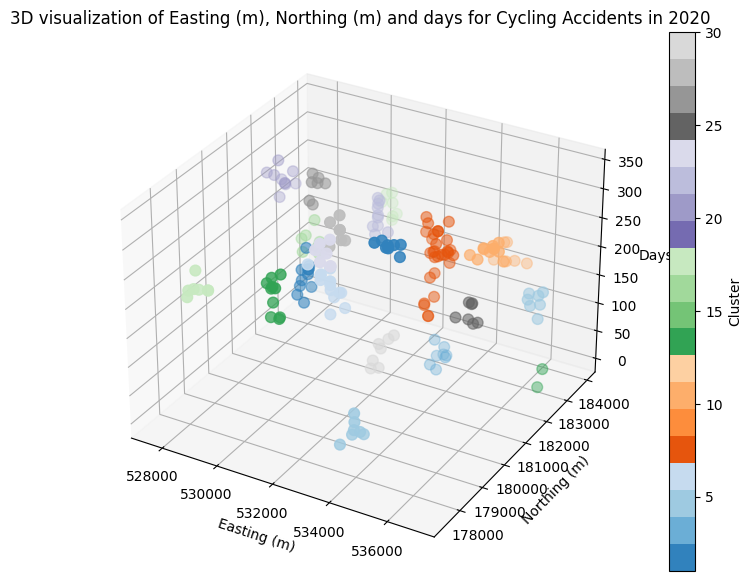

In [206]:
xmin, xmax = 527000, 537000
ymin, ymax = 177000, 184000

# Filtering data based on x and y range
filtered_data_2020 = cluster_data_2020[(cluster_data_2020['x'] >= xmin) & 
                             (cluster_data_2020['x'] <= xmax) & 
                             (cluster_data_2020['y'] >= ymin) & 
                             (cluster_data_2020['y'] <= ymax)]

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(filtered_data_2020['x'], filtered_data_2020['y'], filtered_data_2020['date_num'], c=filtered_data_2020['cluster'], cmap='tab20c', s=60)
ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')
ax.set_zlabel('Days')
ax.set_title('3D visualization of Easting (m), Northing (m) and days for Cycling Accidents in 2020')

# Colorbar
legend = fig.colorbar(scatter, ax=ax)
legend.set_label('Cluster')
plt.savefig('Report_Pictures/stdbscan_2020_3d_small.png', dpi=300)

plt.show()


In [124]:
# cluster_data.to_csv('cluster_data.csv', index=False)

# NKD Visualisation

In [138]:
highways_line_2019 = gpd.read_file("./Data/highways_nkd_line/highways_nkd_line.shp")
highways_line_2020 = gpd.read_file("./Data/highways_nkd_line/highways_nkd_line_2020.shp")

In [139]:
highways_line_2019

,gml_id,length,slope,strt_p_,end_pn_,nrst_c_,density,geometry
0,osgb4000000027865921,2904.80,0.006679,2.0,2.0,0,0.000000,"LINESTRING (531539.442 200769.874, 531592.988 ..."
1,osgb4000000027865922,2911.08,0.006973,2.0,2.0,0,0.000000,"LINESTRING (531539.564 200789.167, 531577.468 ..."
2,osgb4000000027866337,791.79,0.030437,4.0,2.0,0,0.000000,"LINESTRING (530766.057 200859.571, 530782.000 ..."
3,osgb4000000027866338,799.34,0.031526,4.0,2.0,0,0.000000,"LINESTRING (530758.553 200876.366, 530784.000 ..."
4,osgb4000000027869123,552.65,0.024428,1.0,3.0,0,0.000000,"LINESTRING (527045.654 200392.316, 527061.875 ..."
...,...,...,...,...,...,...,...,...
326184,osgb5000005298219064,24.63,-0.016240,3.0,3.0,0,0.000245,"LINESTRING (546662.000 171594.000, 546663.000 ..."
326185,osgb5000005298269717,154.17,-0.010378,1.0,3.0,0,0.000000,"LINESTRING (534963.860 200176.023, 534947.000 ..."
326186,osgb5000005298269741,514.31,-0.000389,3.0,1.0,0,0.000000,"LINESTRING (534597.016 200053.600, 534609.617 ..."
326187,osgb5000005298269781,225.52,-0.006651,3.0,3.0,0,0.000000,"LINESTRING (534597.016 200053.600, 534581.194 ..."


In [140]:
highways_line_2019['density_normalized'] = ((highways_line_2019['density'] - highways_line_2019['density'].min()) / 
                                  (highways_line_2019['density'].max() - highways_line_2019['density'].min())) * 100

highways_line_2019['density_normalized'] = highways_line_2019['density_normalized'].round()

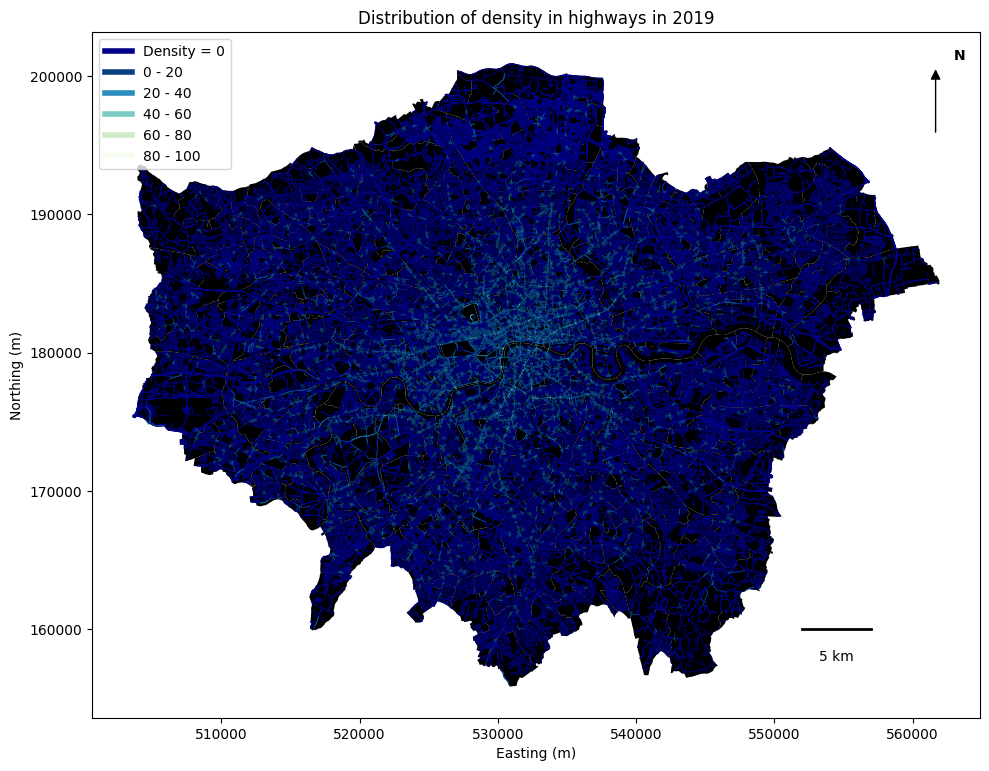

In [310]:
import numpy as np

max_density = highways_line_2019['density_normalized'].max()

n_intervals = int(np.ceil(max_density / 20))

colors = plt.cm.GnBu_r(np.linspace(0, 1, n_intervals))
legend_elements = [Line2D([0], [0], color=color, lw=4, label=f'{i*20} - {(i+1)*20}') for i, color in enumerate(colors)]

legend_elements.insert(0, Line2D([0], [0], color='darkblue', lw=4, label='Density = 0'))

fig, ax = plt.subplots(figsize=(10, 10))

london_gdf.plot(ax=ax, color='black')

highways_line_2019[highways_line_2019['density_normalized'] == 0].plot(ax=ax, color='darkblue', lw=0.5)
highways_line_2019[highways_line_2019['density_normalized'] != 0].plot(column='density_normalized', ax=ax, cmap='GnBu_r', lw=0.5)

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
ax.set_title("Distribution of density in highways in 2019")

arrow = FancyArrowPatch(posA=(0.95, 0.85), posB=(0.95, 0.95),
                        arrowstyle='-|>', mutation_scale=15, color='black', transform=ax.transAxes)
ax.add_patch(arrow)
ax.text(0.97, 0.96, 'N', transform=ax.transAxes, weight='bold', color='black')

scale_length = 5000  # 1 km
ax.plot([552000, 552000 + scale_length], [160000, 160000], color='black', linewidth=2, transform=ax.transData)
ax.text(552000 + scale_length/2, 157500, '5 km', horizontalalignment='center', verticalalignment='bottom', color='black', transform=ax.transData)

ax.legend(handles=legend_elements, loc='upper left')
ax.set_aspect('equal')
fig.tight_layout()
plt.savefig('Report_Pictures/distribution_density_2019.png', dpi=300, bbox_inches='tight')
plt.show()



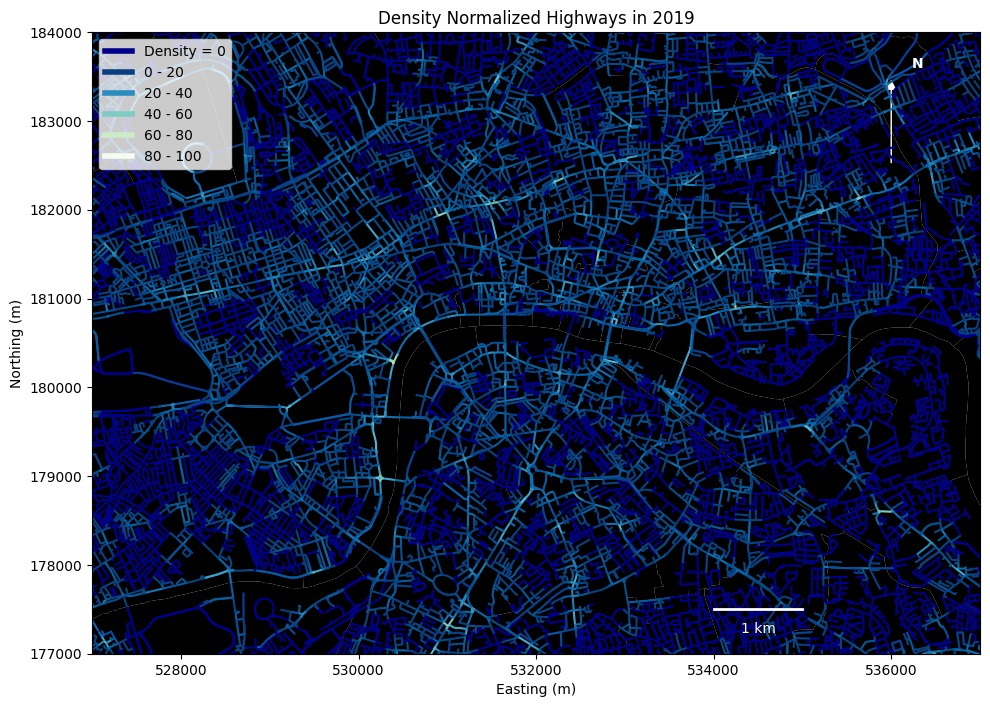

In [309]:
max_density = highways_line_2019['density_normalized'].max()

n_intervals = int(np.ceil(max_density / 20))

colors = plt.cm.GnBu_r(np.linspace(0, 1, n_intervals))
legend_elements = [Line2D([0], [0], color=color, lw=4, label=f'{i*20} - {(i+1)*20}') for i, color in enumerate(colors)]
legend_elements.insert(0, Line2D([0], [0], color='darkblue', lw=4, label='Density = 0'))

fig, ax = plt.subplots(figsize=(10, 10))

london_gdf.plot(ax=ax, color='black')

highways_line_2019[highways_line_2019['density_normalized'] == 0].plot(ax=ax, color='darkblue')
highways_line_2019[highways_line_2019['density_normalized'] != 0].plot(column='density_normalized', ax=ax, cmap='GnBu_r')

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
# plt.title('ST DBSCAN for Cycling Accidents in 2020')
ax.set_title("Density Normalized Highways in 2019")
ax.set_xlim([527000, 537000])
ax.set_ylim([177000, 184000])
arrow_pos_x = 536000  
arrow_pos_y = 182500
arrow_length = 1000 

arrow = FancyArrowPatch((arrow_pos_x, arrow_pos_y), (arrow_pos_x, arrow_pos_y + arrow_length),
                        arrowstyle='-|>', mutation_scale=15, color='white', transform=ax.transData)
ax.add_patch(arrow)
ax.text(arrow_pos_x + 300, arrow_pos_y + arrow_length + 100, 'N', horizontalalignment='center', weight='bold', color='white', transform=ax.transData)

scale_length = 1000  # 1 km
scale_pos_x = 534000  
scale_pos_y = 177500

ax.plot([scale_pos_x, scale_pos_x + scale_length], [scale_pos_y, scale_pos_y], color='white', linewidth=2, transform=ax.transData)
ax.text(scale_pos_x + scale_length/2, scale_pos_y - 300, '1 km', horizontalalignment='center', verticalalignment='bottom', color='white', transform=ax.transData)
ax.legend(handles=legend_elements, loc='upper left')
ax.set_aspect('equal')
fig.tight_layout()
plt.savefig('Report_Pictures/distribution_density_median_2019.png', dpi=300, bbox_inches='tight')
plt.show()

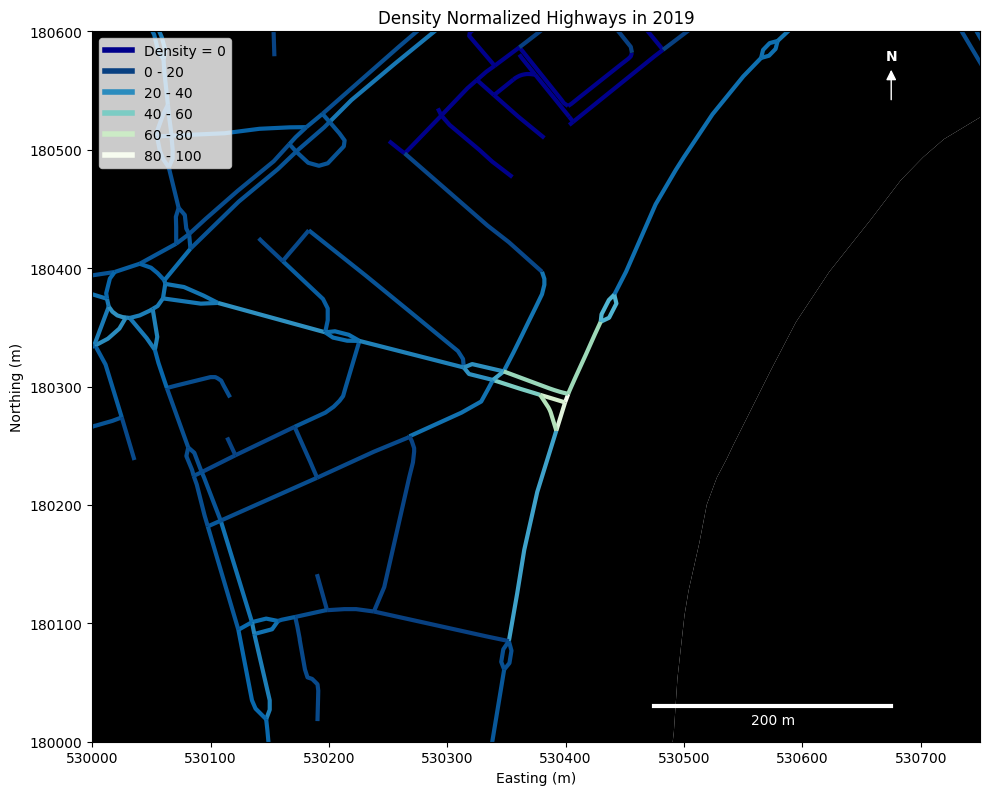

In [308]:
max_density = highways_line_2019['density_normalized'].max()

n_intervals = int(np.ceil(max_density / 20))

colors = plt.cm.GnBu_r(np.linspace(0, 1, n_intervals))
legend_elements = [Line2D([0], [0], color=color, lw=4, label=f'{i*20} - {(i+1)*20}') for i, color in enumerate(colors)]
legend_elements.insert(0, Line2D([0], [0], color='darkblue', lw=4, label='Density = 0'))

fig, ax = plt.subplots(figsize=(10, 10))
london_gdf.plot(ax=ax, color='black')

highways_line_2019[highways_line_2019['density_normalized'] == 0].plot(ax=ax, color='darkblue', linewidth=3)

highways_line_2019[highways_line_2019['density_normalized'] != 0].plot(column='density_normalized', ax=ax, cmap='GnBu_r', linewidth=3)

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
# plt.title('ST DBSCAN for Cycling Accidents in 2020')
ax.set_title("Density Normalized Highways in 2019")
ax.set_xlim([530000, 530750])
ax.set_ylim([180000, 180600])
ax.legend(handles=legend_elements, loc='upper left')

# Add compass
arrow = FancyArrowPatch(posA=(0.9, 0.90), posB=(0.9, 0.95),
                        arrowstyle='-|>', mutation_scale=15, color='white', transform=ax.transAxes)
ax.add_patch(arrow)
ax.text(0.9, 0.96, 'N', transform=ax.transAxes, weight='bold', color='white', ha='center')

scalebar_length = 200
transform = ax.transAxes
coords = ax.get_xlim(), ax.get_ylim()
x_length = coords[0][1] - coords[0][0]
scalebar_end = 0.9 - scalebar_length / x_length
ax.plot([0.9, scalebar_end], [0.05, 0.05], transform=transform, color='white', linewidth=3)
center_loc = (0.9 + scalebar_end) / 2
ax.text(center_loc, 0.03, f"{scalebar_length} m", color='white', transform=transform, ha='center', va='center')
ax.set_aspect('equal')
fig.tight_layout()
plt.savefig('Report_Pictures/distribution_density_small_2019.png', dpi=300, bbox_inches='tight')
plt.show()

## 2020 

In [177]:
highways_line_2020['density_normalized'] = ((highways_line_2020['density'] - highways_line_2020['density'].min()) / 
                                  (highways_line_2020['density'].max() - highways_line_2020['density'].min())) * 100

highways_line_2020['density_normalized'] = highways_line_2020['density_normalized'].round()

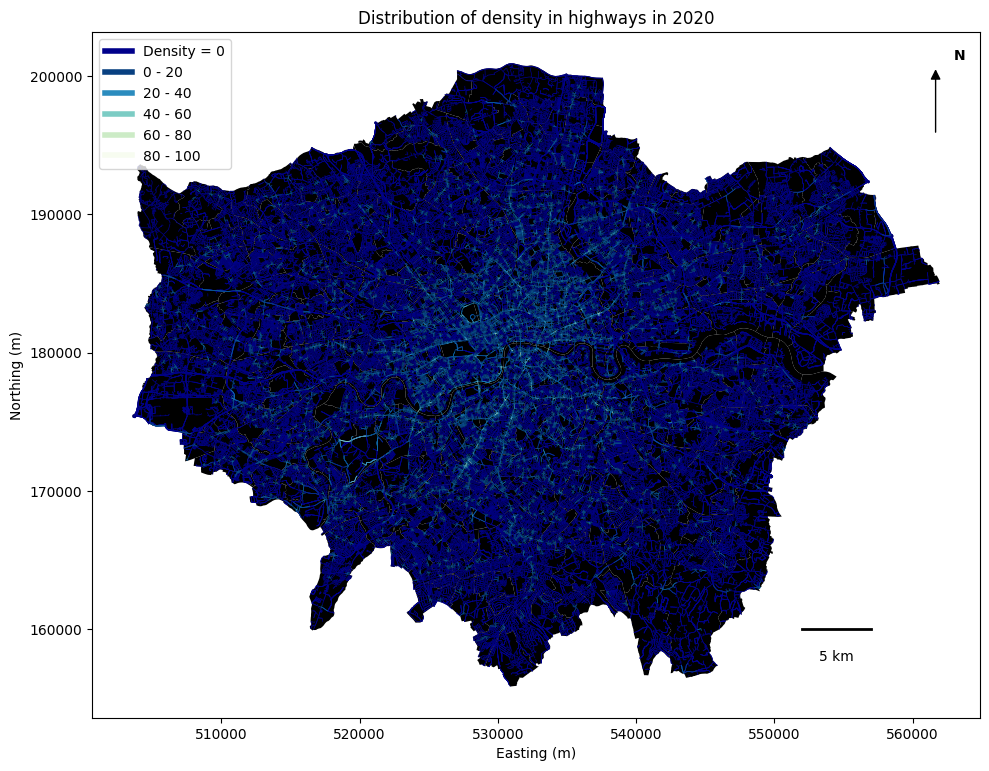

In [307]:
import numpy as np

max_density = highways_line_2020['density_normalized'].max()

n_intervals = int(np.ceil(max_density / 20))

colors = plt.cm.GnBu_r(np.linspace(0, 1, n_intervals))
legend_elements = [Line2D([0], [0], color=color, lw=4, label=f'{i*20} - {(i+1)*20}') for i, color in enumerate(colors)]

legend_elements.insert(0, Line2D([0], [0], color='darkblue', lw=4, label='Density = 0'))

fig, ax = plt.subplots(figsize=(10, 10))

london_gdf.plot(ax=ax, color='black')

highways_line_2020[highways_line_2020['density_normalized'] == 0].plot(ax=ax, color='darkblue', lw=0.5)
# highways_line_2020[highways_line_2020['density_normalized'] != 0].plot(column='density_normalized', ax=ax, cmap='Spectral_r')
highways_line_2020[highways_line_2020['density_normalized'] != 0].plot(column='density_normalized', ax=ax, cmap='GnBu_r', lw=0.5)


plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
ax.set_title("Distribution of density in highways in 2020")

arrow = FancyArrowPatch(posA=(0.95, 0.85), posB=(0.95, 0.95),
                        arrowstyle='-|>', mutation_scale=15, color='black', transform=ax.transAxes)
ax.add_patch(arrow)
ax.text(0.97, 0.96, 'N', transform=ax.transAxes, weight='bold', color='black')

scale_length = 5000  # 1 km
ax.plot([552000, 552000 + scale_length], [160000, 160000], color='black', linewidth=2, transform=ax.transData)
ax.text(552000 + scale_length/2, 157500, '5 km', horizontalalignment='center', verticalalignment='bottom', color='black', transform=ax.transData)

ax.legend(handles=legend_elements, loc='upper left')
ax.set_aspect('equal')
fig.tight_layout()

plt.savefig('Report_Pictures/distribution_density_2020.png', dpi=300, bbox_inches='tight')
plt.show()

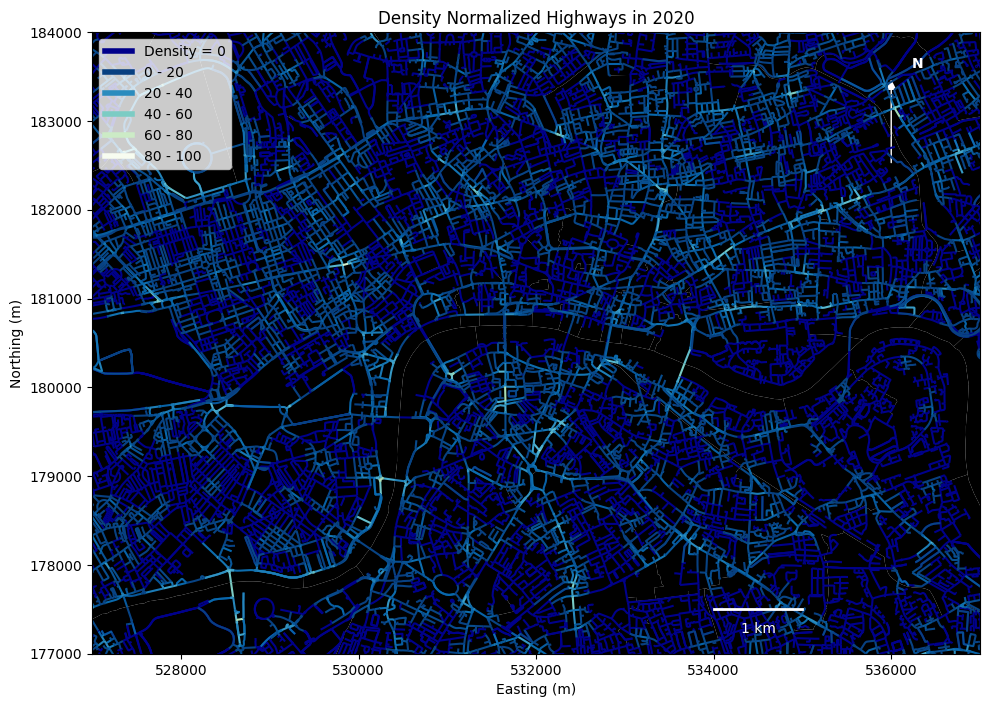

In [306]:
max_density = highways_line_2020['density_normalized'].max()

n_intervals = int(np.ceil(max_density / 20))

colors = plt.cm.GnBu_r(np.linspace(0, 1, n_intervals))
legend_elements = [Line2D([0], [0], color=color, lw=4, label=f'{i*20} - {(i+1)*20}') for i, color in enumerate(colors)]
legend_elements.insert(0, Line2D([0], [0], color='darkblue', lw=4, label='Density = 0'))

fig, ax = plt.subplots(figsize=(10, 10))

london_gdf.plot(ax=ax, color='black')

highways_line_2020[highways_line_2020['density_normalized'] == 0].plot(ax=ax, color='darkblue')
highways_line_2020[highways_line_2020['density_normalized'] != 0].plot(column='density_normalized', ax=ax, cmap='GnBu_r')

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
ax.set_title("Density Normalized Highways in 2020")
ax.set_xlim([527000, 537000])
ax.set_ylim([177000, 184000])
arrow_pos_x = 536000  
arrow_pos_y = 182500
arrow_length = 1000 

arrow = FancyArrowPatch((arrow_pos_x, arrow_pos_y), (arrow_pos_x, arrow_pos_y + arrow_length),
                        arrowstyle='-|>', mutation_scale=15, color='white', transform=ax.transData)
ax.add_patch(arrow)
ax.text(arrow_pos_x + 300, arrow_pos_y + arrow_length + 100, 'N', horizontalalignment='center', weight='bold', color='white', transform=ax.transData)

scale_length = 1000  # 1 km
scale_pos_x = 534000  
scale_pos_y = 177500

ax.plot([scale_pos_x, scale_pos_x + scale_length], [scale_pos_y, scale_pos_y], color='white', linewidth=2, transform=ax.transData)
ax.text(scale_pos_x + scale_length/2, scale_pos_y - 300, '1 km', horizontalalignment='center', verticalalignment='bottom', color='white', transform=ax.transData)
ax.legend(handles=legend_elements, loc='upper left')
ax.set_aspect('equal')
fig.tight_layout()

plt.savefig('Report_Pictures/distribution_density_median_2020.png', dpi=300, bbox_inches='tight')
plt.show()

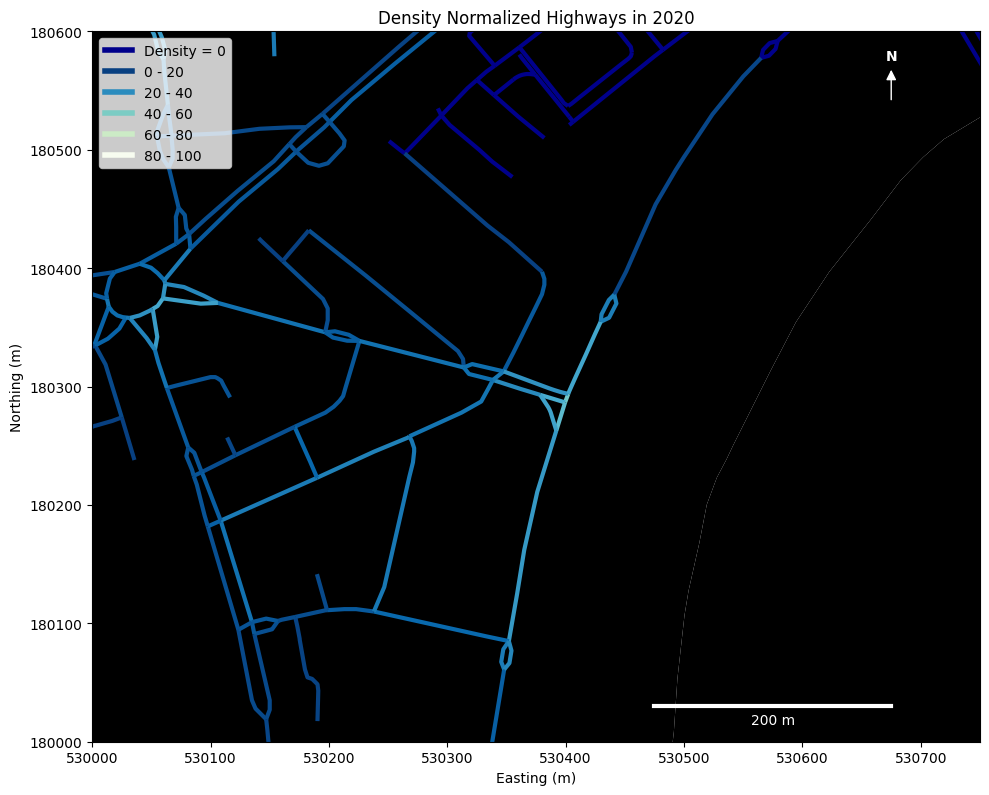

In [305]:
max_density = highways_line_2020['density_normalized'].max()

n_intervals = int(np.ceil(max_density / 20))

colors = plt.cm.GnBu_r(np.linspace(0, 1, n_intervals))
legend_elements = [Line2D([0], [0], color=color, lw=4, label=f'{i*20} - {(i+1)*20}') for i, color in enumerate(colors)]
legend_elements.insert(0, Line2D([0], [0], color='darkblue', lw=4, label='Density = 0'))

fig, ax = plt.subplots(figsize=(10, 10))
london_gdf.plot(ax=ax, color='black')

highways_line_2020[highways_line_2020['density_normalized'] == 0].plot(ax=ax, color='darkblue', linewidth=3)

highways_line_2020[highways_line_2020['density_normalized'] != 0].plot(column='density_normalized', ax=ax, cmap='GnBu_r', linewidth=3)

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
# plt.title('ST DBSCAN for Cycling Accidents in 2020')
ax.set_title("Density Normalized Highways in 2020")
ax.set_xlim([530000, 530750])
ax.set_ylim([180000, 180600])
ax.legend(handles=legend_elements, loc='upper left')

# Add compass
arrow = FancyArrowPatch(posA=(0.9, 0.90), posB=(0.9, 0.95),
                        arrowstyle='-|>', mutation_scale=15, color='white', transform=ax.transAxes)
ax.add_patch(arrow)
ax.text(0.9, 0.96, 'N', transform=ax.transAxes, weight='bold', color='white', ha='center')

scalebar_length = 200
transform = ax.transAxes
coords = ax.get_xlim(), ax.get_ylim()
x_length = coords[0][1] - coords[0][0]
scalebar_end = 0.9 - scalebar_length / x_length
ax.plot([0.9, scalebar_end], [0.05, 0.05], transform=transform, color='white', linewidth=3)
center_loc = (0.9 + scalebar_end) / 2
ax.text(center_loc, 0.03, f"{scalebar_length} m", color='white', transform=transform, ha='center', va='center')

ax.set_aspect('equal')
fig.tight_layout()

plt.savefig('Report_Pictures/distribution_density_small_2020.png', dpi=300, bbox_inches='tight')
plt.show()

# Features

In [193]:
final_highways_2019 = gpd.read_file("./Data/final_highways/final_highways_2019.shp")

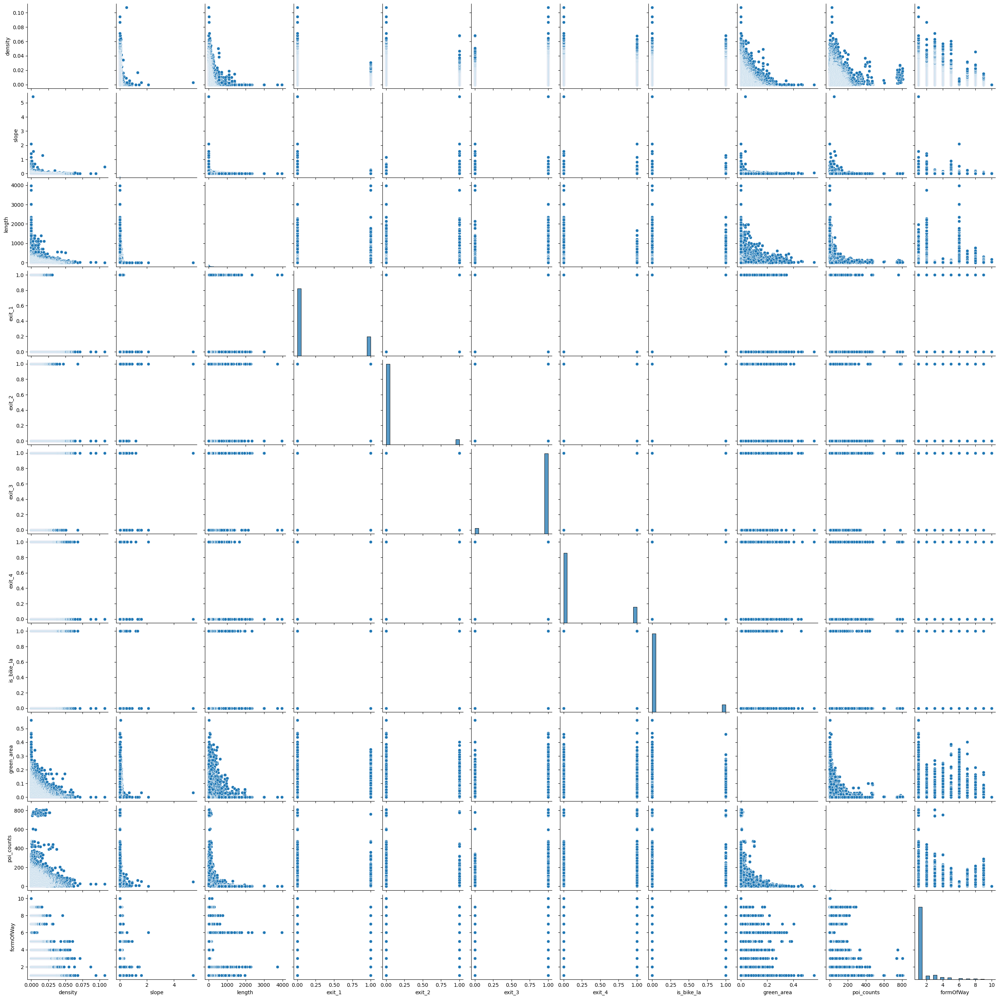

In [196]:
import seaborn as sns
import pandas as pd

# Assuming clipped_highways is a pandas DataFrame
selected_vars = ["density", "slope", "length", "exit_1", "exit_2", "exit_3", 
                 "exit_4", "is_bike_la", "green_area", "poi_counts", "formOfWay"]

plot = sns.pairplot(final_highways_2019[selected_vars])
plot.savefig("Report_Pictures/feature_pairplot.png", dpi=300)


In [235]:
stats_desc = final_highways_2019[selected_vars].describe().loc[['min', 'max']].T

variances = final_highways_2019[selected_vars].var().rename('var')

result_df = pd.concat([stats_desc, variances], axis=1)

print(result_df)

             min          max           var
density     0.00     0.107140      0.000009
slope       0.00     5.428571      0.000511
length      1.05  3972.450000  18183.975470
exit_1      0.00     1.000000      0.171563
exit_2      0.00     1.000000      0.058034
exit_3      0.00     1.000000      0.061184
exit_4      0.00     1.000000      0.150860
is_bike_la  0.00     1.000000      0.079493
green_area  0.00     0.560127      0.000476
poi_counts  0.00   811.000000    557.982089
formOfWay   1.00    10.000000      1.531078


# CAR_results_2019

In [215]:
# Reading the csv file into a DataFrame
CAR_results_2019 = pd.read_csv('CAR_results_2019.csv')

# Display the first few rows of the DataFrame
print(CAR_results_2019.head())

                 gml_id  Fitted_Values
0  osgb4000000030406332       0.138376
1  osgb4000000030406332       0.102937
2  osgb4000000031245538       0.087743
3  osgb4000000031245545       0.181278
4  osgb4000000031245545       0.180049


In [216]:
import geopandas as gpd
from shapely.geometry import Polygon

xmin = 527000
ymin = 177000
xmax = 537000
ymax = 184000

bbox = Polygon([(xmin, ymin), (xmin, ymax), (xmax, ymax), (xmax, ymin)])

clipped_highways_line_2019 = highways_line_2019[highways_line_2019.geometry.intersects(bbox)]

print(clipped_highways_line_2019)


                      gml_id  length     slope  strt_p_  end_pn_  nrst_c_  \
1633    osgb4000000030081983  198.59  0.002518      3.0      3.0        2   
2145    osgb4000000030082280  890.13 -0.000449      3.0      3.0        0   
2146    osgb4000000030082280  890.13 -0.000449      3.0      3.0        0   
2147    osgb4000000030082280  890.13 -0.000449      3.0      3.0        0   
2148    osgb4000000030082280  890.13 -0.000449      3.0      3.0        0   
...                      ...     ...       ...      ...      ...      ...   
326135  osgb5000005297825377    3.06  0.000000      3.0      3.0        0   
326161  osgb5000005297965881   39.48  0.005066      3.0      1.0        0   
326162  osgb5000005297965909    7.57  0.000000      3.0      3.0        0   
326164  osgb5000005298017963   31.74  0.003151      2.0      3.0        0   
326188  osgb5000005298275636  103.05  0.001941      3.0      1.0        0   

         density                                           geometry  \
1633

In [217]:
clipped_highways_line_2019 = clipped_highways_line_2019.merge(CAR_results_2019, on='gml_id', how='left')

print(clipped_highways_line_2019)

                     gml_id  length     slope  strt_p_  end_pn_  nrst_c_  \
0      osgb4000000030081983  198.59  0.002518      3.0      3.0        2   
1      osgb4000000030082280  890.13 -0.000449      3.0      3.0        0   
2      osgb4000000030082280  890.13 -0.000449      3.0      3.0        0   
3      osgb4000000030082280  890.13 -0.000449      3.0      3.0        0   
4      osgb4000000030082280  890.13 -0.000449      3.0      3.0        0   
...                     ...     ...       ...      ...      ...      ...   
26692  osgb5000005297825377    3.06  0.000000      3.0      3.0        0   
26693  osgb5000005297965881   39.48  0.005066      3.0      1.0        0   
26694  osgb5000005297965909    7.57  0.000000      3.0      3.0        0   
26695  osgb5000005298017963   31.74  0.003151      2.0      3.0        0   
26696  osgb5000005298275636  103.05  0.001941      3.0      1.0        0   

        density                                           geometry  \
0      0.026135  

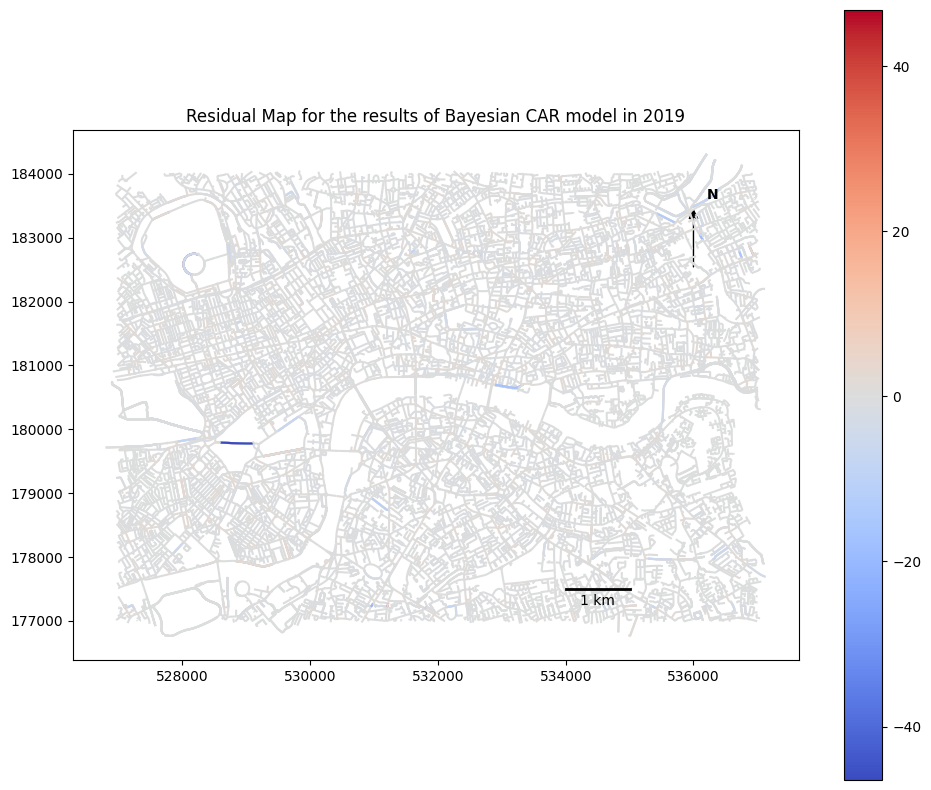

In [322]:
clipped_highways_line_2019['residuals'] = clipped_highways_line_2019['density_normalized'] - clipped_highways_line_2019['Fitted_Values']

# Plot the residuals
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
clipped_highways_line_2019.plot(column='residuals', cmap='coolwarm', legend=True, ax=ax)
plt.title("Residual Map for the results of Bayesian CAR model in 2019")

arrow_pos_x = 536000  
arrow_pos_y = 182500
arrow_length = 1000 

arrow = FancyArrowPatch((arrow_pos_x, arrow_pos_y), (arrow_pos_x, arrow_pos_y + arrow_length),
                        arrowstyle='-|>', mutation_scale=15, color='black', transform=ax.transData)

ax.text(arrow_pos_x + 300, arrow_pos_y + arrow_length + 100, 'N', horizontalalignment='center', weight='bold', color='black', transform=ax.transData)

scale_length = 1000  # 1 km
scale_pos_x = 534000  
scale_pos_y = 177500

ax.plot([scale_pos_x, scale_pos_x + scale_length], [scale_pos_y, scale_pos_y], color='black', linewidth=2, transform=ax.transData)
ax.text(scale_pos_x + scale_length/2, scale_pos_y - 300, '1 km', horizontalalignment='center', verticalalignment='bottom', color='black', transform=ax.transData)
ax.add_patch(arrow)
ax.set_aspect('equal')
fig.tight_layout()

plt.savefig('Report_Pictures/residual_map_2019.png', dpi=300, bbox_inches='tight')
plt.show()


In [218]:
print(clipped_highways_line_2019['Fitted_Values'].describe())

count    26488.000000
mean         3.482993
std          5.812435
min          0.002303
25%          0.356267
50%          1.089436
75%          3.972335
max         99.665089
Name: Fitted_Values, dtype: float64


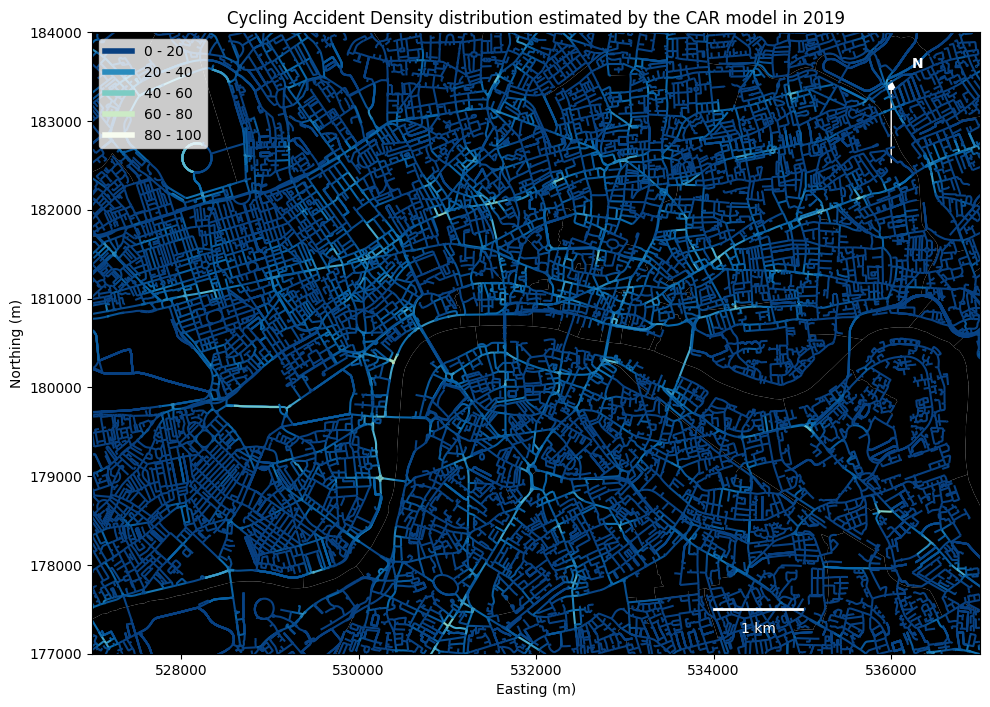

In [304]:
max_density = clipped_highways_line_2019['Fitted_Values'].max()

n_intervals = int(np.ceil(max_density / 20))

colors = plt.cm.GnBu_r(np.linspace(0, 1, n_intervals))
legend_elements = [Line2D([0], [0], color=color, lw=4, label=f'{i*20} - {(i+1)*20}') for i, color in enumerate(colors)]
# legend_elements.insert(0, Line2D([0], [0], color='darkgrey', lw=4, label='Density = 0'))

fig, ax = plt.subplots(figsize=(10, 10))

london_gdf.plot(ax=ax, color='black')

# clipped_highways_line_2019[clipped_highways_line_2019['Fitted_Values'] == 0].plot(ax=ax, color='darkgrey')
clipped_highways_line_2019[clipped_highways_line_2019['Fitted_Values'] != 0].plot(column='Fitted_Values', ax=ax, cmap='GnBu_r')

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
ax.set_title("Cycling Accident Density distribution estimated by the CAR model in 2019")
ax.set_xlim([527000, 537000])
ax.set_ylim([177000, 184000])
arrow_pos_x = 536000  
arrow_pos_y = 182500
arrow_length = 1000 

arrow = FancyArrowPatch((arrow_pos_x, arrow_pos_y), (arrow_pos_x, arrow_pos_y + arrow_length),
                        arrowstyle='-|>', mutation_scale=15, color='white', transform=ax.transData)
ax.add_patch(arrow)
ax.text(arrow_pos_x + 300, arrow_pos_y + arrow_length + 100, 'N', horizontalalignment='center', weight='bold', color='white', transform=ax.transData)

scale_length = 1000  # 1 km
scale_pos_x = 534000  
scale_pos_y = 177500

ax.plot([scale_pos_x, scale_pos_x + scale_length], [scale_pos_y, scale_pos_y], color='white', linewidth=2, transform=ax.transData)
ax.text(scale_pos_x + scale_length/2, scale_pos_y - 300, '1 km', horizontalalignment='center', verticalalignment='bottom', color='white', transform=ax.transData)
ax.legend(handles=legend_elements, loc='upper left')
ax.set_aspect('equal')
fig.tight_layout()

plt.savefig('Report_Pictures/fitted_density_median_2019.png', dpi=300, bbox_inches='tight')
plt.show()

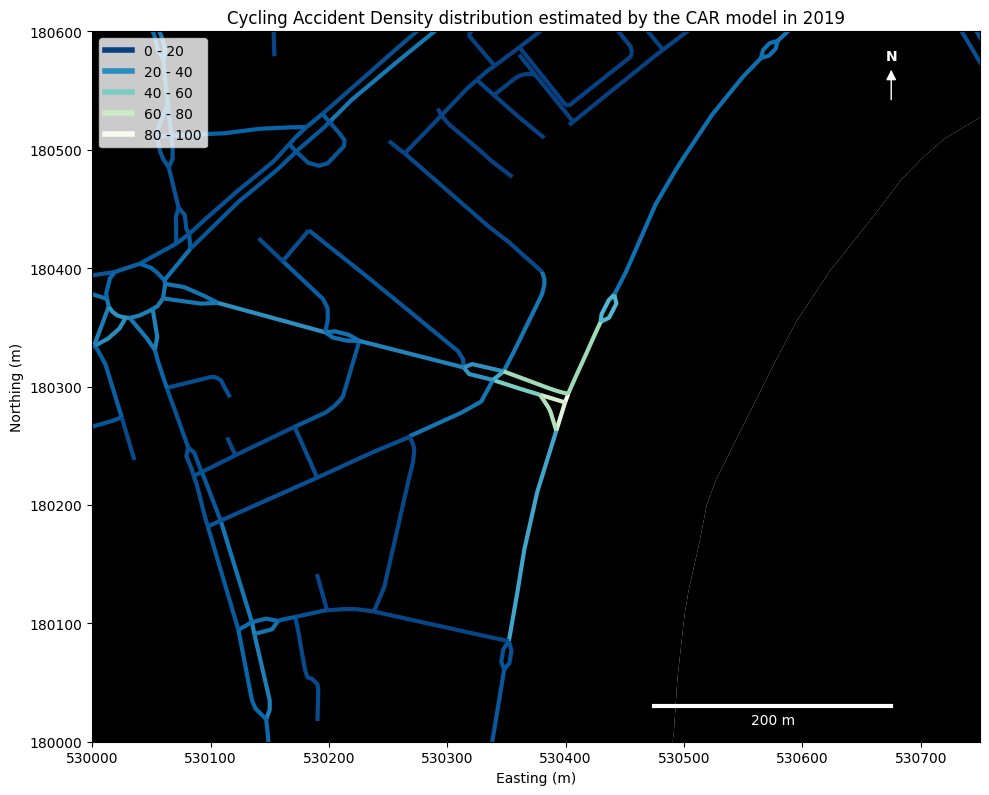

In [301]:
max_density = clipped_highways_line_2019['Fitted_Values'].max()

n_intervals = int(np.ceil(max_density / 20))

colors = plt.cm.GnBu_r(np.linspace(0, 1, n_intervals))
legend_elements = [Line2D([0], [0], color=color, lw=4, label=f'{i*20} - {(i+1)*20}') for i, color in enumerate(colors)]
# legend_elements.insert(0, Line2D([0], [0], color='darkgrey', lw=4, label='Density = 0'))

fig, ax = plt.subplots(figsize=(10, 10))

london_gdf.plot(ax=ax, color='black')

# clipped_highways_line_2019[clipped_highways_line_2019['Fitted_Values'] == 0].plot(ax=ax, color='darkgrey')
clipped_highways_line_2019[clipped_highways_line_2019['Fitted_Values'] != 0].plot(column='Fitted_Values', ax=ax, cmap='GnBu_r', lw=3)

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
ax.set_title("Cycling Accident Density distribution estimated by the CAR model in 2019")

ax.set_xlim([530000, 530750])
ax.set_ylim([180000, 180600])
ax.legend(handles=legend_elements, loc='upper left')

# Add compass
arrow = FancyArrowPatch(posA=(0.9, 0.90), posB=(0.9, 0.95),
                        arrowstyle='-|>', mutation_scale=15, color='white', transform=ax.transAxes)
ax.add_patch(arrow)
ax.text(0.9, 0.96, 'N', transform=ax.transAxes, weight='bold', color='white', ha='center')

scalebar_length = 200
transform = ax.transAxes
coords = ax.get_xlim(), ax.get_ylim()
x_length = coords[0][1] - coords[0][0]
scalebar_end = 0.9 - scalebar_length / x_length
ax.plot([0.9, scalebar_end], [0.05, 0.05], transform=transform, color='white', linewidth=3)
center_loc = (0.9 + scalebar_end) / 2
ax.text(center_loc, 0.03, f"{scalebar_length} m", color='white', transform=transform, ha='center', va='center')

ax.set_aspect('equal')
fig.tight_layout()
plt.savefig('Report_Pictures/fitted_density_small_2019.png', dpi=300, bbox_inches='tight')
plt.show()

# CAR_results_2020

In [226]:
# Reading the csv file into a DataFrame
CAR_results_2020 = pd.read_csv('CAR_results_2020.csv')

# Display the first few rows of the DataFrame
print(CAR_results_2020.head())

                 gml_id  Fitted_Values
0  osgb4000000030406332       0.128258
1  osgb4000000030406332       0.153395
2  osgb4000000031245538       0.165525
3  osgb4000000030406346       0.383086
4  osgb4000000030406346       0.380707


In [227]:
xmin = 527000
ymin = 177000
xmax = 537000
ymax = 184000

bbox = Polygon([(xmin, ymin), (xmin, ymax), (xmax, ymax), (xmax, ymin)])

clipped_highways_line_2020 = highways_line_2020[highways_line_2020.geometry.intersects(bbox)]

print(clipped_highways_line_2020)

                      gml_id  length     slope  strt_p_  end_pn_   density  \
1628    osgb4000000030081983  198.59  0.002518      3.0      3.0  0.019185   
2122    osgb4000000030082280  890.13 -0.000449      3.0      3.0  0.000000   
2123    osgb4000000030082280  890.13 -0.000449      3.0      3.0  0.000000   
2124    osgb4000000030082280  890.13 -0.000449      3.0      3.0  0.000091   
2125    osgb4000000030082280  890.13 -0.000449      3.0      3.0  0.000005   
...                      ...     ...       ...      ...      ...       ...   
312877  osgb5000005297825377    3.06  0.000000      3.0      3.0  0.000354   
312903  osgb5000005297965881   39.48  0.005066      3.0      1.0  0.000470   
312904  osgb5000005297965909    7.57  0.000000      3.0      3.0  0.000705   
312906  osgb5000005298017963   31.74  0.003151      2.0      3.0  0.001964   
312930  osgb5000005298275636  103.05  0.001941      3.0      1.0  0.000636   

                                                 geometry  dens

In [228]:
clipped_highways_line_2020 = clipped_highways_line_2020.merge(CAR_results_2020, on='gml_id', how='left')

print(clipped_highways_line_2020)

                     gml_id  length     slope  strt_p_  end_pn_   density  \
0      osgb4000000030081983  198.59  0.002518      3.0      3.0  0.019185   
1      osgb4000000030082280  890.13 -0.000449      3.0      3.0  0.000000   
2      osgb4000000030082280  890.13 -0.000449      3.0      3.0  0.000000   
3      osgb4000000030082280  890.13 -0.000449      3.0      3.0  0.000091   
4      osgb4000000030082280  890.13 -0.000449      3.0      3.0  0.000005   
...                     ...     ...       ...      ...      ...       ...   
26692  osgb5000005297825377    3.06  0.000000      3.0      3.0  0.000354   
26693  osgb5000005297965881   39.48  0.005066      3.0      1.0  0.000470   
26694  osgb5000005297965909    7.57  0.000000      3.0      3.0  0.000705   
26695  osgb5000005298017963   31.74  0.003151      2.0      3.0  0.001964   
26696  osgb5000005298275636  103.05  0.001941      3.0      1.0  0.000636   

                                                geometry  density_normalize

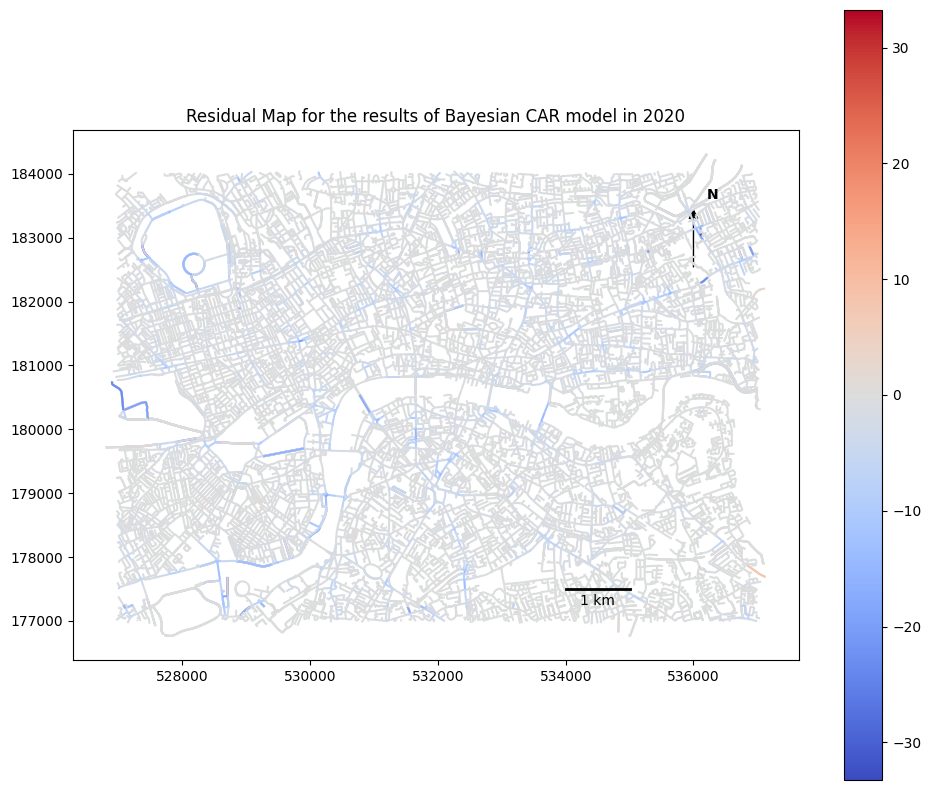

In [332]:
clipped_highways_line_2020['residuals'] = clipped_highways_line_2020['density_normalized'] - clipped_highways_line_2020['Fitted_Values']
residuals = clipped_highways_line_2020['residuals']
vmax_value = max(abs(residuals.min()), residuals.max())
vmin_value = -vmax_value

# Plot the residuals
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
clipped_highways_line_2020.plot(column='residuals', cmap='coolwarm', legend=True, ax=ax, vmin=vmin_value, vmax=vmax_value)
plt.title("Residual Map for the results of Bayesian CAR model in 2020")

arrow_pos_x = 536000  
arrow_pos_y = 182500
arrow_length = 1000 

arrow = FancyArrowPatch((arrow_pos_x, arrow_pos_y), (arrow_pos_x, arrow_pos_y + arrow_length),
                        arrowstyle='-|>', mutation_scale=15, color='black', transform=ax.transData)

ax.text(arrow_pos_x + 300, arrow_pos_y + arrow_length + 100, 'N', horizontalalignment='center', weight='bold', color='black', transform=ax.transData)

scale_length = 1000  # 1 km
scale_pos_x = 534000  
scale_pos_y = 177500

ax.plot([scale_pos_x, scale_pos_x + scale_length], [scale_pos_y, scale_pos_y], color='black', linewidth=2, transform=ax.transData)
ax.text(scale_pos_x + scale_length/2, scale_pos_y - 300, '1 km', horizontalalignment='center', verticalalignment='bottom', color='black', transform=ax.transData)
ax.add_patch(arrow)
ax.set_aspect('equal')
fig.tight_layout()

plt.savefig('Report_Pictures/residual_map_2020.png', dpi=300, bbox_inches='tight')
plt.show()

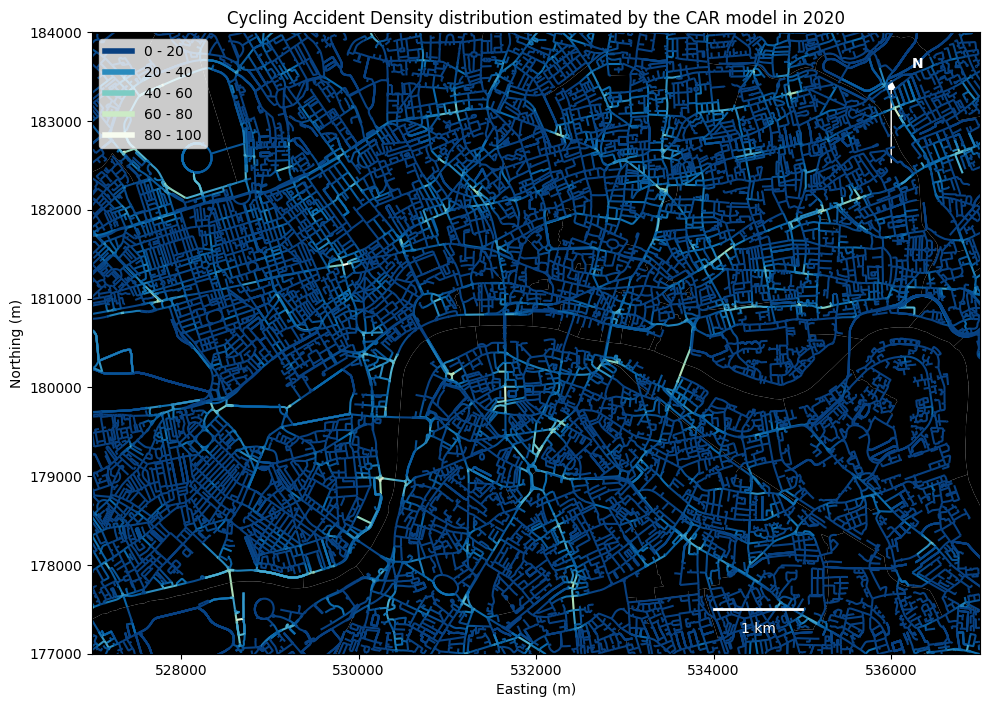

In [303]:
max_density = clipped_highways_line_2020['Fitted_Values'].max()

n_intervals = int(np.ceil(max_density / 20))

colors = plt.cm.GnBu_r(np.linspace(0, 1, n_intervals))
legend_elements = [Line2D([0], [0], color=color, lw=4, label=f'{i*20} - {(i+1)*20}') for i, color in enumerate(colors)]
# legend_elements.insert(0, Line2D([0], [0], color='darkgrey', lw=4, label='Density = 0'))

fig, ax = plt.subplots(figsize=(10, 10))

london_gdf.plot(ax=ax, color='black')

# clipped_highways_line_2019[clipped_highways_line_2019['Fitted_Values'] == 0].plot(ax=ax, color='darkgrey')
clipped_highways_line_2020[clipped_highways_line_2020['Fitted_Values'] != 0].plot(column='Fitted_Values', ax=ax, cmap='GnBu_r')

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
ax.set_title("Cycling Accident Density distribution estimated by the CAR model in 2020")
ax.set_xlim([527000, 537000])
ax.set_ylim([177000, 184000])
arrow_pos_x = 536000  
arrow_pos_y = 182500
arrow_length = 1000 

arrow = FancyArrowPatch((arrow_pos_x, arrow_pos_y), (arrow_pos_x, arrow_pos_y + arrow_length),
                        arrowstyle='-|>', mutation_scale=15, color='white', transform=ax.transData)
ax.add_patch(arrow)
ax.text(arrow_pos_x + 300, arrow_pos_y + arrow_length + 100, 'N', horizontalalignment='center', weight='bold', color='white', transform=ax.transData)

scale_length = 1000  # 1 km
scale_pos_x = 534000  
scale_pos_y = 177500

ax.plot([scale_pos_x, scale_pos_x + scale_length], [scale_pos_y, scale_pos_y], color='white', linewidth=2, transform=ax.transData)
ax.text(scale_pos_x + scale_length/2, scale_pos_y - 300, '1 km', horizontalalignment='center', verticalalignment='bottom', color='white', transform=ax.transData)
ax.legend(handles=legend_elements, loc='upper left')
ax.set_aspect('equal')
fig.tight_layout()

plt.savefig('Report_Pictures/fitted_density_median_2020.png', dpi=300, bbox_inches='tight')
plt.show()

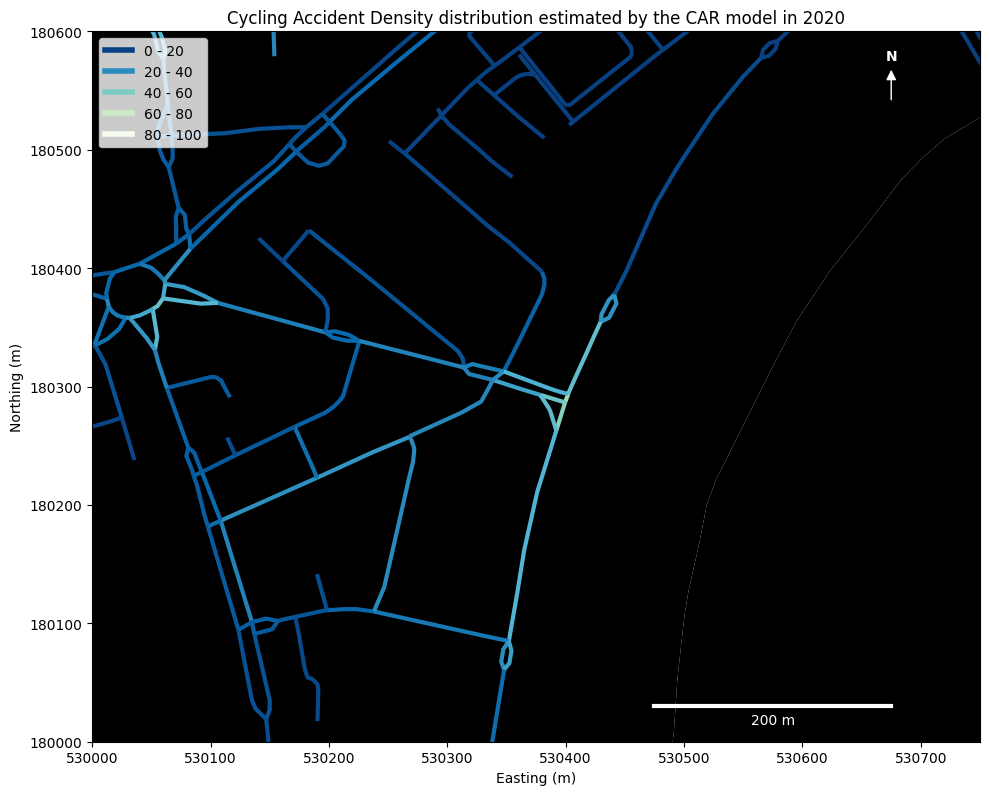

In [302]:
max_density = clipped_highways_line_2020['Fitted_Values'].max()

n_intervals = int(np.ceil(max_density / 20))

colors = plt.cm.GnBu_r(np.linspace(0, 1, n_intervals))
legend_elements = [Line2D([0], [0], color=color, lw=4, label=f'{i*20} - {(i+1)*20}') for i, color in enumerate(colors)]
# legend_elements.insert(0, Line2D([0], [0], color='darkgrey', lw=4, label='Density = 0'))

fig, ax = plt.subplots(figsize=(10, 10))

london_gdf.plot(ax=ax, color='black')

# clipped_highways_line_2019[clipped_highways_line_2019['Fitted_Values'] == 0].plot(ax=ax, color='darkgrey')
clipped_highways_line_2020[clipped_highways_line_2020['Fitted_Values'] != 0].plot(column='Fitted_Values', ax=ax, cmap='GnBu_r', lw=3)

plt.xlabel('Easting (m)')
plt.ylabel('Northing (m)')
ax.set_title("Cycling Accident Density distribution estimated by the CAR model in 2020")

ax.set_xlim([530000, 530750])
ax.set_ylim([180000, 180600])
ax.legend(handles=legend_elements, loc='upper left')

# Add compass
arrow = FancyArrowPatch(posA=(0.9, 0.90), posB=(0.9, 0.95),
                        arrowstyle='-|>', mutation_scale=15, color='white', transform=ax.transAxes)
ax.add_patch(arrow)
ax.text(0.9, 0.96, 'N', transform=ax.transAxes, weight='bold', color='white', ha='center')

scalebar_length = 200
transform = ax.transAxes
coords = ax.get_xlim(), ax.get_ylim()
x_length = coords[0][1] - coords[0][0]
scalebar_end = 0.9 - scalebar_length / x_length
ax.plot([0.9, scalebar_end], [0.05, 0.05], transform=transform, color='white', linewidth=3)
center_loc = (0.9 + scalebar_end) / 2
ax.text(center_loc, 0.03, f"{scalebar_length} m", color='white', transform=transform, ha='center', va='center')
ax.set_aspect('equal')
fig.tight_layout()

plt.savefig('Report_Pictures/fitted_density_small_2020.png', dpi=300, bbox_inches='tight')
plt.show()